In [1]:
import geopandas as gpd
import xarray as xr
import rasterio
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import rioxarray as rxr
from scipy import stats, interpolate
from statsmodels.distributions.empirical_distribution import ECDF
import datetime as dt
from scipy.stats import norm
from copulae import GaussianCopula, ClaytonCopula, FrankCopula, GumbelCopula, StudentCopula # Using Copulae Module
import seaborn as sns
from scipy.stats import kendalltau

In [2]:
# Set dataset dir

dataset = '../../datasets/'
et = os.path.join(dataset, 'et/gha_lsa_et.nc')
precipitation = os.path.join(dataset, 'precipitation_chirps/precip_chirps_gha.nc')
tws = os.path.join(dataset, 'gha_tws.nc')
water_mask = os.path.join(dataset, 'water_mask/water_body.shp')
landform = os.path.join(dataset, 'landform/landform.tif')

Categories found: [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15 255]


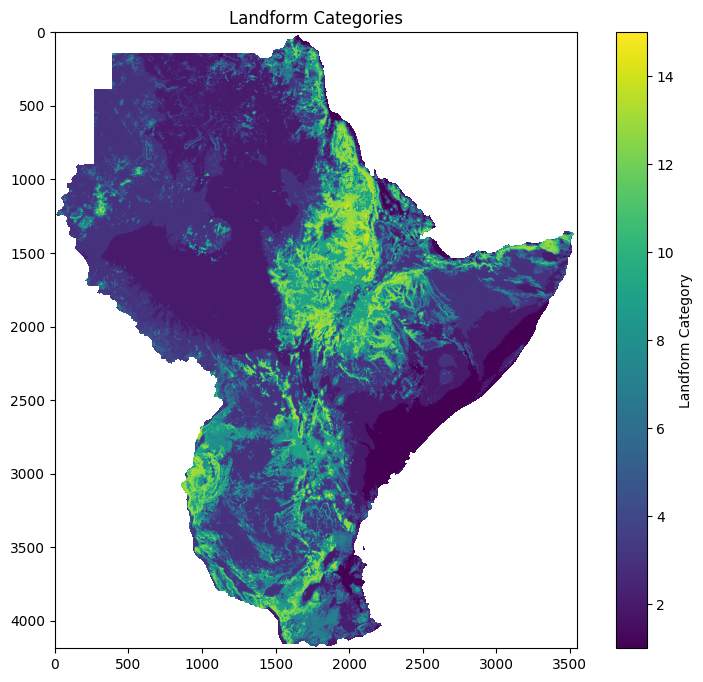

In [9]:
# Open the raster file
with rasterio.open(landform) as src:
    # Read the data (assuming it's a single band)
    data = src.read(1)  # Read the first band
    
    # Get the unique categories in the data
    categories = np.unique(data)
    print(f"Categories found: {categories}")

    # Mask any nodata values (if specified in the file)
    nodata = src.nodata
    if nodata is not None:
        data = np.ma.masked_where(data == nodata, data)

# Plot the data with a categorical colormap
plt.figure(figsize=(10, 8))
plt.imshow(data, cmap='viridis')  # 'tab20' is good for up to 20 distinct categories
plt.colorbar(label='Landform Category')
plt.title('Landform Categories')
plt.show()

In [3]:
# Open and display

et_data = xr.open_dataset(et)['ET']

precipitation_data = xr.open_dataset(precipitation)['precipitation']

tws_data = xr.open_dataset(tws)['twsddk']

In [4]:
et_data

<xarray.DataArray 'ET' (time: 252, lat: 697, lon: 592)>
[103981248 values with dtype=float64]
Coordinates:
  * lat      (lat) float32 23.1 23.05 23.0 22.95 ... -11.55 -11.6 -11.65 -11.7
  * lon      (lon) float32 21.85 21.9 21.95 22.0 22.05 ... 51.25 51.3 51.35 51.4
  * time     (time) datetime64[ns] 2004-01-01 2004-02-01 ... 2024-12-01
Attributes:
    long_name:     ET
    units:         mm
    grid_mapping:  crs

In [5]:
precipitation_data

<xarray.DataArray 'precipitation' (time: 250, y: 698, x: 591)>
[103129500 values with dtype=float32]
Coordinates:
    band     int64 ...
  * x        (x) float64 21.88 21.93 21.98 22.03 ... 51.23 51.28 51.33 51.38
  * y        (y) float64 23.12 23.07 23.02 22.97 ... -11.58 -11.63 -11.68 -11.73
  * time     (time) datetime64[ns] 2004-01-01 2004-02-01 ... 2024-10-01
Attributes:
    AREA_OR_POINT:             Area
    TIFFTAG_DATETIME:          2015:01:30 07:43:45
    TIFFTAG_DOCUMENTNAME:      /home/CHIRPS/monthly/v2.0/africa/chirps-v2.0.2...
    TIFFTAG_IMAGEDESCRIPTION:  IDL TIFF file
    TIFFTAG_RESOLUTIONUNIT:    2 (pixels/inch)
    TIFFTAG_SOFTWARE:          IDL 8.3, Exelis Visual Information Solutions, ...
    TIFFTAG_XRESOLUTION:       100
    TIFFTAG_YRESOLUTION:       100
    units:                     mm
    grid_mapping:              spatial_ref

In [6]:
tws_data = tws_data.sel(time=slice('2004-01-01', None))

# Convert units: tws (m) to mm
tws_data = tws_data * 1000 
tws_data

<xarray.DataArray 'twsddk' (lat: 34, lon: 30, time: 219)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * time     (time) datetime64[ns] 2004-01-15T12:00:00 ... 2024-10-15T12:00:00
  * lat      (lat) float64 -11.0 -10.0 -9.0 -8.0 -7.0 ... 19.0 20.0 21.0 22.0
  * lon      (lon) float64 22.0 23.0 24.0 25.0 26.0 ... 47.0 48.0 49.0 50.0 51.0

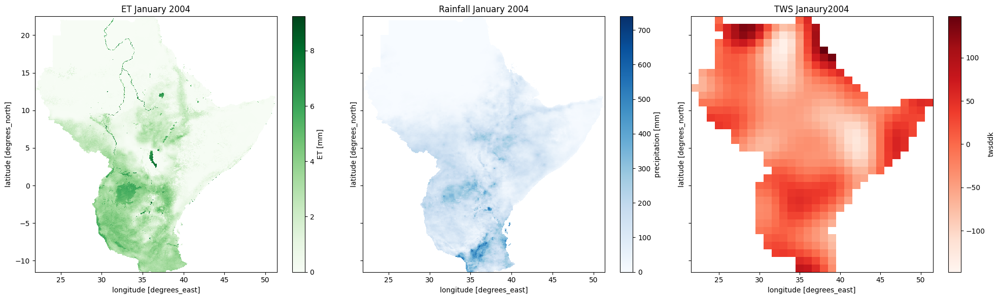

In [19]:
et1 = et_data.isel(time=0)
precip1 = precipitation_data.isel(time=0)
tws1 = tws_data.isel(time=0)

# Set up the figure and axes (1 row, 3 columns)
fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=True)


# Plot ET
et1.plot(ax=axes[0], cmap="Greens", add_colorbar=True)
axes[0].set_title("ET January {}".format(et1.time.dt.year.values))

# Plot Rainfall
precip1.plot(ax=axes[1], cmap="Blues", add_colorbar=True)
axes[1].set_title("Rainfall January {}".format(precip1.time.dt.year.values))

# Plot TWS
tws1.plot(ax=axes[2], cmap="Reds", add_colorbar=True)
axes[2].set_title("TWS Janaury{}".format(tws1.time.dt.year.values))

plt.tight_layout()
plt.show()

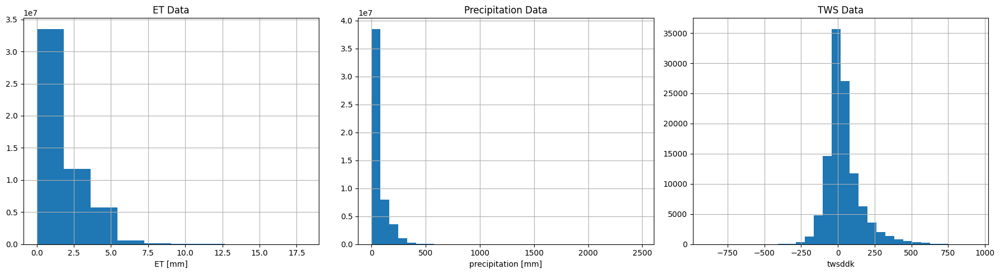

In [20]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=False)

et_data.plot.hist(ax=axes[0], bins=10)
axes[0].grid(True)
axes[0].set_title('ET Data')

precipitation_data.plot.hist(ax=axes[1], bins=30)
axes[1].grid(True)
axes[1].set_title('Precipitation Data')

tws_data.plot.hist(ax=axes[2], bins=30)
axes[2].grid(True)
axes[2].set_title('TWS Data')

plt.tight_layout()
plt.show()

In [54]:
# Variables at a location in GHA

lat = 5.34
lon = 45.34

et_poi = et_data.sel(lat=lat, lon=lon, method='nearest')
pre_poi = precipitation_data.sel(y=lat, x=lon, method='nearest')
tws_poi = tws_data.sel(lat=lat, lon=lon, method='nearest')

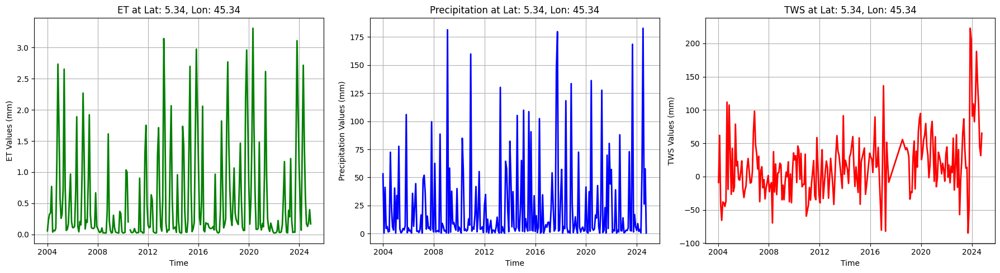

In [24]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=False)

# ET time series
axes[0].plot(et_poi.time, et_poi.values, color='green', linewidth=2)
axes[0].set_title('ET at Lat: {:.2f}, Lon: {:.2f}'.format(lat, lon), fontsize=12)
axes[0].set_xlabel('Time', fontsize=10)
axes[0].set_ylabel('ET Values (mm)', fontsize=10)
axes[0].grid(True)

# Precipitation time series
axes[1].plot(pre_poi.time, pre_poi.values, color='blue', linewidth=2)
axes[1].set_title('Precipitation at Lat: {:.2f}, Lon: {:.2f}'.format(lat, lon), fontsize=12)
axes[1].set_xlabel('Time', fontsize=10)
axes[1].set_ylabel('Precipitation Values (mm)', fontsize=10)
axes[1].grid(True)

# TWS time series
axes[2].plot(tws_poi.time, tws_poi.values, color='red', linewidth=2)
axes[2].set_title('TWS at Lat: {:.2f}, Lon: {:.2f}'.format(lat, lon), fontsize=12)
axes[2].set_xlabel('Time', fontsize=10)
axes[2].set_ylabel('TWS Values (mm)', fontsize=10)
axes[2].grid(True)

# Adjust layout
plt.tight_layout()
plt.show()

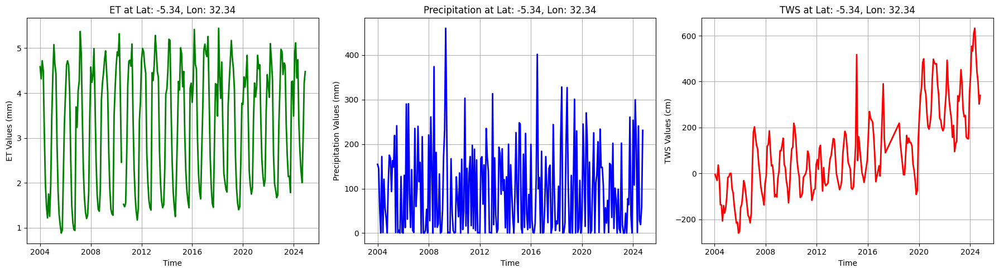

In [25]:
# Variables at a location in GHA

lat = -5.34
lon = 32.34

et_poi = et_data.sel(lat=lat, lon=lon, method='nearest')
pre_poi = precipitation_data.sel(y=lat, x=lon, method='nearest')
tws_poi = tws_data.sel(lat=lat, lon=lon, method='nearest')

fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=False)

# ET time series
axes[0].plot(et_poi.time, et_poi.values, color='green', linewidth=2)
axes[0].set_title('ET at Lat: {:.2f}, Lon: {:.2f}'.format(lat, lon), fontsize=12)
axes[0].set_xlabel('Time', fontsize=10)
axes[0].set_ylabel('ET Values (mm)', fontsize=10)
axes[0].grid(True)

# Precipitation time series
axes[1].plot(pre_poi.time, pre_poi.values, color='blue', linewidth=2)
axes[1].set_title('Precipitation at Lat: {:.2f}, Lon: {:.2f}'.format(lat, lon), fontsize=12)
axes[1].set_xlabel('Time', fontsize=10)
axes[1].set_ylabel('Precipitation Values (mm)', fontsize=10)
axes[1].grid(True)

# TWS time series
axes[2].plot(tws_poi.time, tws_poi.values, color='red', linewidth=2)
axes[2].set_title('TWS at Lat: {:.2f}, Lon: {:.2f}'.format(lat, lon), fontsize=12)
axes[2].set_xlabel('Time', fontsize=10)
axes[2].set_ylabel('TWS Values (cm)', fontsize=10)
axes[2].grid(True)

# Adjust layout
plt.tight_layout()
plt.show()

#### Large TS Plots

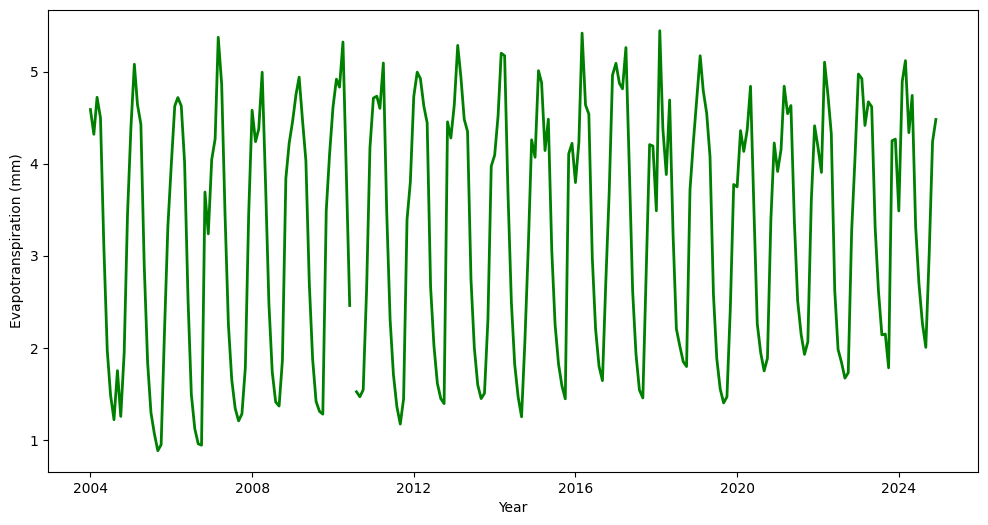

In [77]:
plt.figure(figsize=(12, 6))  # Adjust width and height as needed
plt.plot(et_poi.time, et_poi.values, color='green', linewidth=2)
plt.xlabel("Year")
plt.ylabel("Evapotranspiration (mm)")
# plt.title("Time Series Plot")
plt.show()

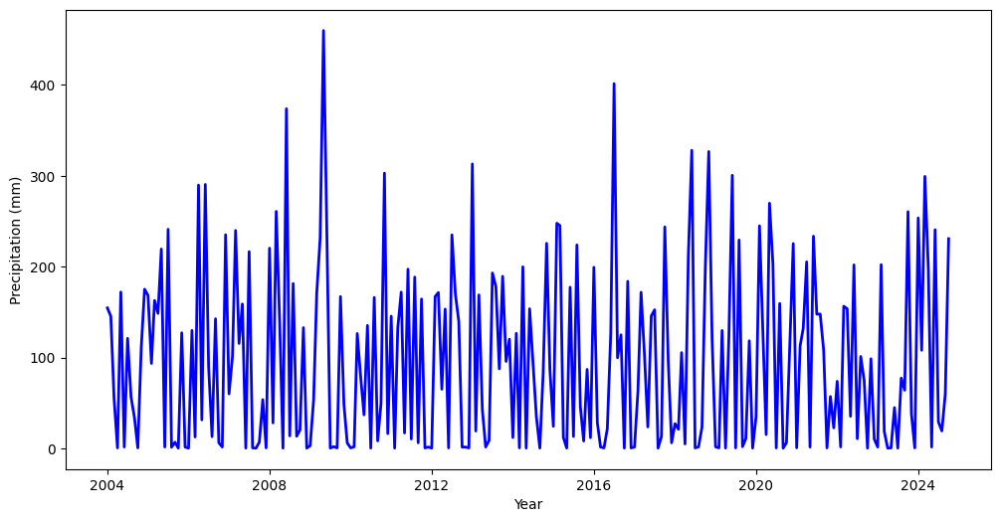

In [78]:
plt.figure(figsize=(12, 6))  # Adjust width and height as needed
plt.plot(pre_poi.time, pre_poi.values, color='blue', linewidth=2)
plt.xlabel("Year")
plt.ylabel("Precipitation (mm)")
# plt.title("Time Series Plot")
plt.show()


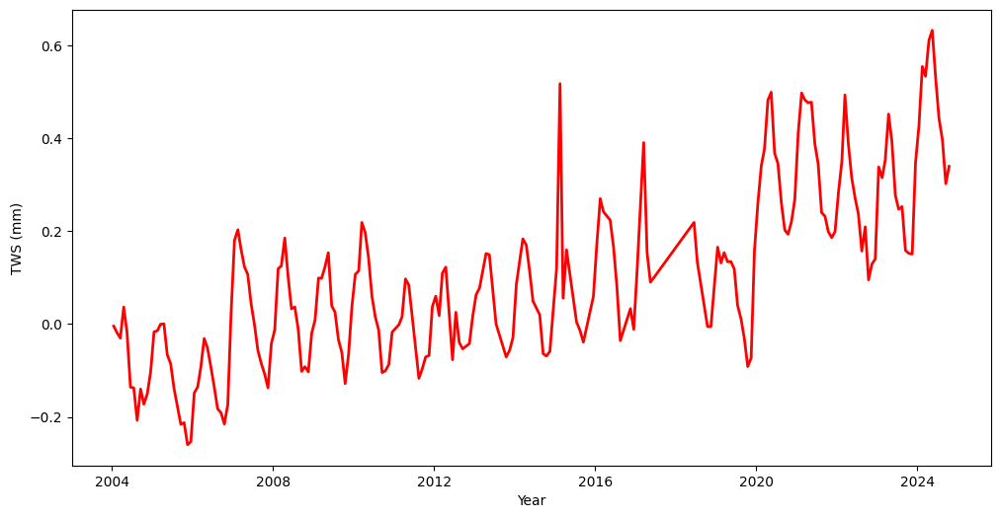

In [79]:
plt.figure(figsize=(12, 6))  # Adjust width and height as needed
plt.plot(tws_poi.time, tws_poi.values, color='red', linewidth=2)
plt.xlabel("Year")
plt.ylabel("TWS (mm)")
# plt.title("Time Series Plot")
plt.show()


#### Spatial Alignment

In [7]:
tws_data.rio.write_crs("EPSG:4326", inplace=True)
et_data.rio.write_crs("EPSG:4326", inplace=True)
precipitation_data.rio.write_crs("EPSG:4326", inplace=True)

# Spatial upscale to 1-degree
et_resampled = et_data.rio.reproject_match(
    tws_data, resampling=rasterio.enums.Resampling.average
)
precip_resampled = precipitation_data.rio.reproject_match(
    tws_data, resampling=rasterio.enums.Resampling.average
)


#### Temporal alignment

In [ ]:
common_time = tws_data.time
et_resampled = et_resampled.sel(time=common_time, method="nearest")
precip_resampled = precip_resampled.sel(time=common_time, method="nearest")


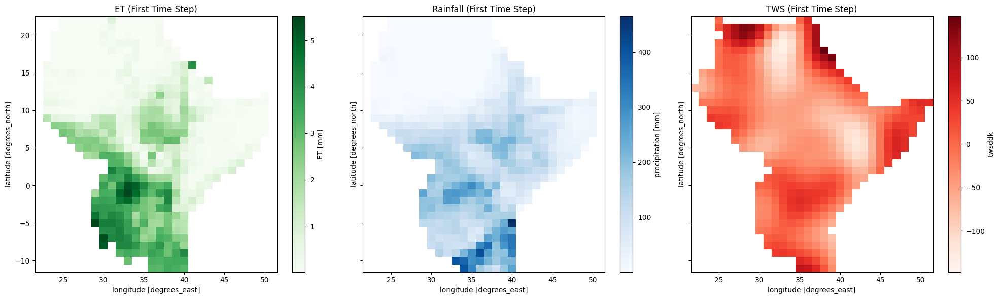

In [28]:
# Plot the regrided datasets

et2 = et_resampled.isel(time=0)
precip2 = precip_resampled.isel(time=0)
tws2 = tws_data.isel(time=0)

# Set up the figure and axes (1 row, 3 columns)
fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=True)


# Plot ET
et2.plot(ax=axes[0], cmap="Greens", add_colorbar=True)
axes[0].set_title("ET (First Time Step)")

# Plot Rainfall
precip2.plot(ax=axes[1], cmap="Blues", add_colorbar=True)
axes[1].set_title("Rainfall (First Time Step)")

# Plot TWS
tws2.plot(ax=axes[2], cmap="Reds", add_colorbar=True)
axes[2].set_title("TWS (First Time Step)")

plt.tight_layout()
plt.show()

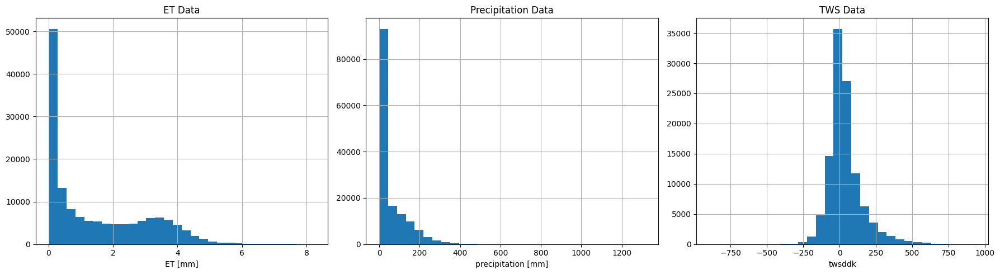

In [29]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=False)

et_resampled.plot.hist(ax=axes[0], bins=30)
axes[0].grid(True)
axes[0].set_title('ET Data')

precip_resampled.plot.hist(ax=axes[1], bins=30)
axes[1].grid(True)
axes[1].set_title('Precipitation Data')

tws_data.plot.hist(ax=axes[2], bins=30)
axes[2].grid(True)
axes[2].set_title('TWS Data')

plt.tight_layout()
plt.show()

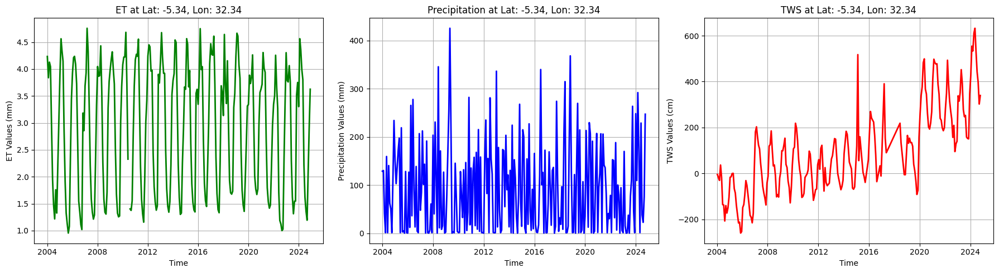

In [34]:
# Variables at a location in GHA

lat = -5.34
lon = 32.34

et_poi = et_resampled.sel(y=lat, x=lon, method='nearest')
pre_poi = precip_resampled.sel(y=lat, x=lon, method='nearest')
tws_poi = tws_data.sel(lat=lat, lon=lon, method='nearest')

fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=False)

# ET time series
axes[0].plot(et_poi.time, et_poi.values, color='green', linewidth=2)
axes[0].set_title('ET at Lat: {:.2f}, Lon: {:.2f}'.format(lat, lon), fontsize=12)
axes[0].set_xlabel('Time', fontsize=10)
axes[0].set_ylabel('ET Values (mm)', fontsize=10)
axes[0].grid(True)

# Precipitation time series
axes[1].plot(pre_poi.time, pre_poi.values, color='blue', linewidth=2)
axes[1].set_title('Precipitation at Lat: {:.2f}, Lon: {:.2f}'.format(lat, lon), fontsize=12)
axes[1].set_xlabel('Time', fontsize=10)
axes[1].set_ylabel('Precipitation Values (mm)', fontsize=10)
axes[1].grid(True)

# TWS time series
axes[2].plot(tws_poi.time, tws_poi.values, color='red', linewidth=2)
axes[2].set_title('TWS at Lat: {:.2f}, Lon: {:.2f}'.format(lat, lon), fontsize=12)
axes[2].set_xlabel('Time', fontsize=10)
axes[2].set_ylabel('TWS Values (cm)', fontsize=10)
axes[2].grid(True)

# Adjust layout
plt.tight_layout()
plt.show()

#### Exponential moving average

In [45]:
# # Apply EMA (3-month span)
def apply_ema(da, span=3):
    # # EMA via exponentially weighted moving average
    # # Alpha = 2/(span+1) for equivalence to pandas .ewm
    # alpha = 2 / (span + 1)
    return da.rolling_exp(time=span, window_type="span").mean()


ds_et_ema = apply_ema(et_resampled, span=6)
ds_precip_ema = apply_ema(precip_resampled, span=6)

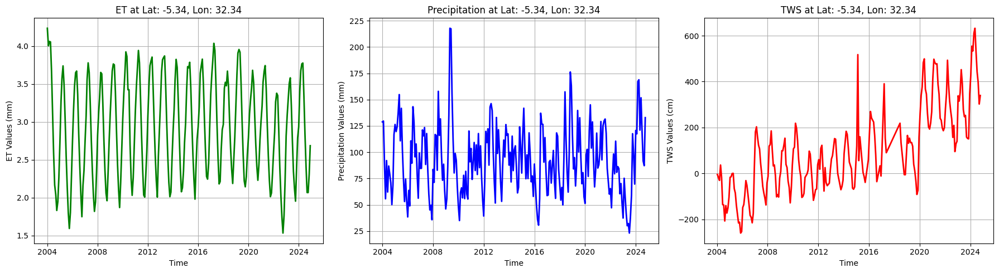

In [46]:
# Variables at a location in GHA

lat = -5.34
lon = 32.34

et_poi = ds_et_ema.sel(y=lat, x=lon, method='nearest')
pre_poi = ds_precip_ema.sel(y=lat, x=lon, method='nearest')
tws_poi = tws_data.sel(lat=lat, lon=lon, method='nearest')

fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=False)

# ET time series
axes[0].plot(et_poi.time, et_poi.values, color='green', linewidth=2)
axes[0].set_title('ET at Lat: {:.2f}, Lon: {:.2f}'.format(lat, lon), fontsize=12)
axes[0].set_xlabel('Time', fontsize=10)
axes[0].set_ylabel('ET Values (mm)', fontsize=10)
axes[0].grid(True)

# Precipitation time series
axes[1].plot(pre_poi.time, pre_poi.values, color='blue', linewidth=2)
axes[1].set_title('Precipitation at Lat: {:.2f}, Lon: {:.2f}'.format(lat, lon), fontsize=12)
axes[1].set_xlabel('Time', fontsize=10)
axes[1].set_ylabel('Precipitation Values (mm)', fontsize=10)
axes[1].grid(True)

# TWS time series
axes[2].plot(tws_poi.time, tws_poi.values, color='red', linewidth=2)
axes[2].set_title('TWS at Lat: {:.2f}, Lon: {:.2f}'.format(lat, lon), fontsize=12)
axes[2].set_xlabel('Time', fontsize=10)
axes[2].set_ylabel('TWS Values (cm)', fontsize=10)
axes[2].grid(True)

# Adjust layout
plt.tight_layout()
plt.show()

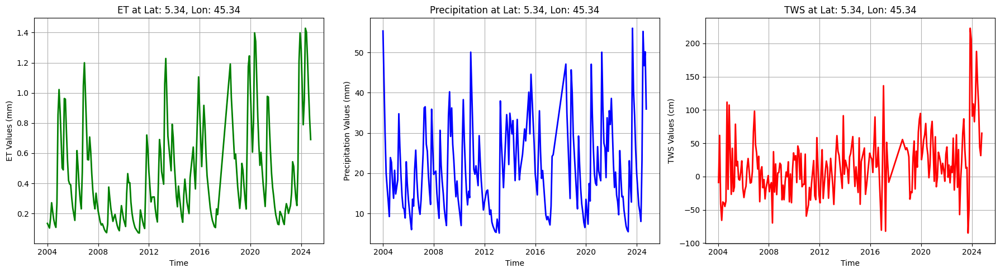

In [58]:
# Variables at a location in GHA

lat = -5.34
lon = 32.34

lat = 5.34
lon = 45.34

et_poi = ds_et_aligned.sel(y=lat, x=lon, method='nearest')
pre_poi = ds_precip_aligned.sel(y=lat, x=lon, method='nearest')
tws_poi = tws_data.sel(lat=lat, lon=lon, method='nearest')

fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=False)

# ET time series
axes[0].plot(et_poi.time, et_poi.values, color='green', linewidth=2)
axes[0].set_title('ET at Lat: {:.2f}, Lon: {:.2f}'.format(lat, lon), fontsize=12)
axes[0].set_xlabel('Time', fontsize=10)
axes[0].set_ylabel('ET Values (mm)', fontsize=10)
axes[0].grid(True)

# Precipitation time series
axes[1].plot(pre_poi.time, pre_poi.values, color='blue', linewidth=2)
axes[1].set_title('Precipitation at Lat: {:.2f}, Lon: {:.2f}'.format(lat, lon), fontsize=12)
axes[1].set_xlabel('Time', fontsize=10)
axes[1].set_ylabel('Precipitation Values (mm)', fontsize=10)
axes[1].grid(True)

# TWS time series
axes[2].plot(tws_poi.time, tws_poi.values, color='red', linewidth=2)
axes[2].set_title('TWS at Lat: {:.2f}, Lon: {:.2f}'.format(lat, lon), fontsize=12)
axes[2].set_xlabel('Time', fontsize=10)
axes[2].set_ylabel('TWS Values (cm)', fontsize=10)
axes[2].grid(True)

# Adjust layout
plt.tight_layout()
plt.show()

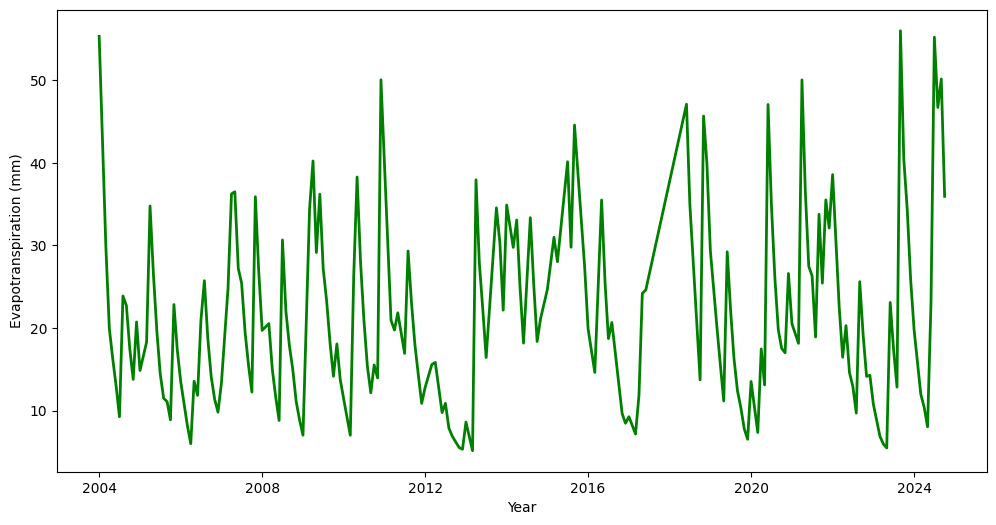

In [60]:
plt.figure(figsize=(12, 6))  # Adjust width and height as needed
plt.plot(et_poi.time, pre_poi.values, color='green', linewidth=2)
plt.xlabel("Year")
plt.ylabel("Evapotranspiration (mm)")
# plt.title("Time Series Plot")
plt.show()

### Anomalies Calculation

#### Evapotranspitation

In [85]:
# Calculate monthly climatology (mean for each month over the years)
et_climatology = et_data.groupby("time.month").mean("time")

# Calculate anomalies
et_anomalies = et_data.groupby("time.month") - et_climatology

# Calculate monthly standard deviation over the years
et_std = et_data.groupby("time.month").std("time")

# Calculate standardized anomalies
et_standardized_anomalies = et_anomalies / et_std


In [86]:
et_standardized_anomalies

<xarray.DataArray 'ET' (time: 252, lat: 697, lon: 592, month: 12)>
array([[[[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
...
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]]]])
Coordinates:
  * lat      (lat) float32 23.1 23.05 23.0 22.95 ... -11.55 -11.6 -11.65 -11.7
  * lon      (lon) float32 21.85 21.9 21.95 22.0 22.05 ... 51.25 51.3 51.35 51.4
  * time     (time) datetime64[ns] 2004-01-01 2004-02-01 ... 2024-12-01
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

#### Precipitation

In [87]:
# Calculate monthly climatology (mean for each month over the years)
precipitation_clim = precipitation_data.groupby("time.month").mean("time")

# Calculate anomalies
precipitation_anomalies = precipitation_data.groupby("time.month") - precipitation_clim

# Calculate the standard deviation for each month over the years
precipitation_std = precipitation_data.groupby("time.month").std("time")

# Calculate standardized anomalies
pre_standardized_anomalies = precipitation_anomalies / precipitation_std


In [88]:
pre_standardized_anomalies

<xarray.DataArray 'precipitation' (time: 250, y: 698, x: 591, month: 12)>
array([[[[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
...
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]]]], dtype=float32)
Coordinates:
    band     (time) int64 1 1 1 1 1 1 1 1 1 1 1 1 1 ... 1 1 1 1 1 1 1 1 1 1 1 1
  * x        (x) float64 21.88 21.93 21.98 22.03 ... 51.23 51.28 51.33 51.38
  * y        (y) float64 23.12 23.07 23.02 22.97 ... -11.58 -11.63 -11.68 -11.73
  * time     (time) datetime64[ns] 2004-01-01 2004-02-01 ... 2024-10-01
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

#### TWS

In [89]:
# Calculate monthly climatology (mean for each month over the years)
tws_clim = tws_data.groupby("time.month").mean("time")

# Calculate anomalies
tws_anomalies = tws_data.groupby("time.month") - tws_clim

# Calculate the standard deviation for each month over the years
tws_std = tws_data.groupby("time.month").std("time")

# Calculate standardized anomalies
tws_standardized_anomalies = tws_anomalies / tws_std


In [90]:
tws_standardized_anomalies

<xarray.DataArray 'twsddk' (lat: 34, lon: 30, time: 219, month: 12)>
array([[[[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
...
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]]]])
Coordinates:
  * time     (time) datetime64[ns] 2004-01-15T12:00:00 ... 2024-10-15T12:00:00
  * lat      (lat) float64 -11.0 -10.0 -9.0 -8.0 -7.0 ... 19.0 20.0 21.0 22.0
  * lon      (lon) float64 22.0 23.0 24.0 25.0 26.0 ... 47.0 48.0 49.0 50.0 51.0
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

### Standardization with regridded data

In [91]:
# ET
et_climatology = et_resampled.groupby("time.month").mean("time")
et_anomalies = et_resampled.groupby("time.month") - et_climatology
et_std = et_resampled.groupby("time.month").std("time")
et_st_anomalies = et_anomalies.groupby("time.month") / et_std

In [92]:
# Preciptation
precipitation_clim = precip_resampled.groupby("time.month").mean("time")
precipitation_anomalies = precip_resampled.groupby("time.month") - precipitation_clim
precipitation_std = precip_resampled.groupby("time.month").std("time")
pre_st_anomalies = precipitation_anomalies.groupby("time.month") / precipitation_std


In [93]:
# TWS
tws_clim = tws_data.groupby("time.month").mean("time")
tws_anomalies = tws_data.groupby("time.month") - tws_clim
tws_std = tws_data.groupby("time.month").std("time")
tws_st_anomalies = tws_anomalies.groupby("time.month") / tws_std

In [61]:
# ET
et_climatology = ds_et_aligned.groupby("time.month").mean("time")
et_anomalies = ds_et_aligned.groupby("time.month") - et_climatology
et_std = ds_et_aligned.groupby("time.month").std("time")
et_st_anomalies = et_anomalies.groupby("time.month") / et_std

# Preciptation
precipitation_clim = ds_precip_aligned.groupby("time.month").mean("time")
precipitation_anomalies = ds_precip_aligned.groupby("time.month") - precipitation_clim
precipitation_std = ds_precip_aligned.groupby("time.month").std("time")
pre_st_anomalies = precipitation_anomalies.groupby("time.month") / precipitation_std

# TWS
tws_clim = tws_data.groupby("time.month").mean("time")
tws_anomalies = tws_data.groupby("time.month") - tws_clim
tws_std = tws_data.groupby("time.month").std("time")
tws_st_anomalies = tws_anomalies.groupby("time.month") / tws_std

#### Export the anomalies

In [94]:
# et_st_anomalies.to_netcdf(os.path.join(dataset, 'et_standardized_anomaly.nc'))
# pre_st_anomalies.to_netcdf(os.path.join(dataset, 'precip_standardized_anomaly.nc'))
# tws_st_anomalies.to_netcdf(os.path.join(dataset, 'tws_standardized_anomaly.nc'))

In [74]:
landform = rxr.open_rasterio(landform).squeeze()
landform_reproj = landform.rio.reproject_match(tws_data, resampling=rasterio.enums.Resampling.nearest)
regions = np.unique(landform_reproj.data[~np.isnan(landform_reproj.data)])
print(f"Regions: {regions}")

# Mask regions
# regional_data = {}
# for region_id in regions:
#     mask = landform_reproj == region_id
#     regional_data[region_id] = {
#         "tws": ds_combined["tws"].where(mask),
#         "et_ema": ds_combined["et_ema"].where(mask),
#         "precip_ema": ds_combined["precip_ema"].where(mask)
#     }

TypeError: invalid path or file: <xarray.DataArray (y: 4188, x: 3550)>
[14867400 values with dtype=uint8]
Coordinates:
    band         int64 1
  * x            (x) float64 21.84 21.85 21.85 21.86 ... 51.39 51.4 51.4 51.41
  * y            (y) float64 23.15 23.14 23.13 23.12 ... -11.73 -11.74 -11.75
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:  Area
    LAYER_TYPE:     athematic
    _FillValue:     255
    scale_factor:   1.0
    add_offset:     0.0
    long_name:      meybeck1km

## Marginal Distribution

#### Clean data and stack

In [63]:
# Remove NaNs from the standardised anomalies
et_clean = et_st_anomalies.stack(dims=['x', 'y', 'time'])

et_clean = et_clean[~np.isnan(et_clean)]
et_clean

<xarray.DataArray 'ET' (dims: 126795)>
array([-3.57616548, -2.36570642, -2.36570642, ...,  0.90893306,
        0.66306134,  0.15006482])
Coordinates:
    crs          (dims) int64 0 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0 0
    spatial_ref  (dims) int64 0 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0 0
    month        (dims) int64 1 3 3 4 5 6 7 8 9 10 11 ... 1 3 3 4 5 6 7 8 9 10
  * dims         (dims) object MultiIndex
  * x            (dims) float64 23.0 23.0 23.0 23.0 23.0 ... 50.0 50.0 50.0 50.0
  * y            (dims) float64 9.0 9.0 9.0 9.0 9.0 ... 12.0 12.0 12.0 12.0 12.0
  * time         (dims) datetime64[ns] 2004-01-01 2004-03-01 ... 2024-10-01

In [65]:
# Stack all dimensions
precip_clean = pre_st_anomalies.stack(dims=['x', 'y', 'time'])

precip_clean = precip_clean[~np.isnan(precip_clean)]
precip_clean

<xarray.DataArray 'precipitation' (dims: 127020)>
array([-1.778841  , -0.8620692 , -0.8620692 , ..., -0.44028738,
       -0.06243521, -0.8440064 ], dtype=float32)
Coordinates:
    band         (dims) int64 1 1 1 1 1 1 1 1 1 1 1 1 ... 1 1 1 1 1 1 1 1 1 1 1
    spatial_ref  (dims) int64 0 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0 0
    month        (dims) int64 1 3 3 4 5 6 7 8 9 10 11 ... 1 3 3 4 5 6 7 8 9 10
  * dims         (dims) object MultiIndex
  * x            (dims) float64 23.0 23.0 23.0 23.0 23.0 ... 50.0 50.0 50.0 50.0
  * y            (dims) float64 9.0 9.0 9.0 9.0 9.0 ... 12.0 12.0 12.0 12.0 12.0
  * time         (dims) datetime64[ns] 2004-01-01 2004-03-01 ... 2024-10-01

In [69]:
# Stack all dimensions
tws_clean = tws_st_anomalies.stack(dims=['lon', 'lat', 'time'])

tws_clean = tws_clean[~np.isnan(tws_clean)]
tws_clean

<xarray.DataArray 'twsddk' (dims: 111033)>
array([-1.27401966, -0.4312428 , -0.94214184, ...,  1.50595881,
        0.60692815,  0.8223124 ])
Coordinates:
    spatial_ref  (dims) int64 0 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0 0
    month        (dims) int64 1 2 3 4 5 6 7 8 9 10 11 ... 1 2 3 4 5 6 7 8 9 10
  * dims         (dims) object MultiIndex
  * lon          (dims) float64 22.0 22.0 22.0 22.0 22.0 ... 51.0 51.0 51.0 51.0
  * lat          (dims) float64 13.0 13.0 13.0 13.0 13.0 ... 11.0 11.0 11.0 11.0
  * time         (dims) datetime64[ns] 2004-01-15T12:00:00 ... 2024-10-15T12:...

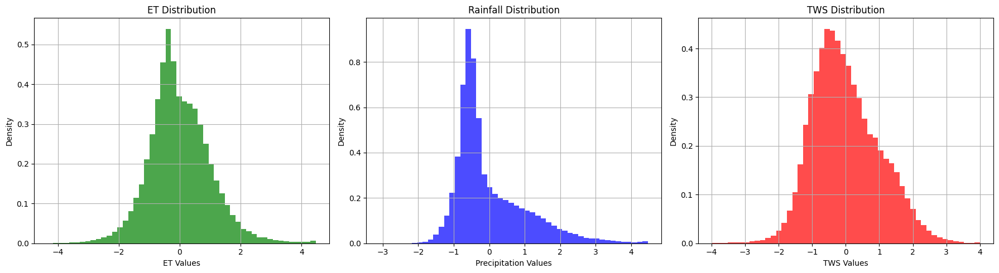

In [98]:
# Plot the histogram
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot ET Histogram
axes[0].hist(et_clean, bins=50, density=True, alpha=0.7, color='green')
axes[0].set_title("ET Distribution")
axes[0].set_xlabel("ET Values")
axes[0].set_ylabel("Density")
axes[0].grid(True)

# Plot Precipitation Histogram
axes[1].hist(precip_clean, bins=50, density=True, alpha=0.7, color='blue')
axes[1].set_title("Rainfall Distribution")
axes[1].set_xlabel("Precipitation Values")
axes[1].set_ylabel("Density")
axes[1].grid(True)

# Plot TWS Histogram
axes[2].hist(tws_clean, bins=50, density=True, alpha=0.7, color='red')
axes[2].set_title("TWS Distribution")
axes[2].set_xlabel("TWS Values")
axes[2].set_ylabel("Density")
axes[2].grid(True)

# Adjust layout
plt.tight_layout()
plt.show()


## Read the anomalies

In [99]:
# et_clean = xr.open_dataset(os.path.join(dataset, 'et_standardized_anomaly.nc'))['ET']

# precip_clean = xr.open_dataset(os.path.join(dataset, 'precip_standardized_anomaly.nc'))['precipitation']

# tws_clean = xr.open_dataset(os.path.join(dataset, 'tws_standardized_anomaly.nc'))['twsddk']

(array([   99.,   683.,  3602., 18563., 48908., 35752., 14565.,  3589.,
         1004.,   492.]),
 array([-4.33346666, -3.45292688, -2.5723871 , -1.69184731, -0.81130753,
         0.06923226,  0.94977204,  1.83031183,  2.71085161,  3.59139139,
         4.47193118]),
 <BarContainer object of 10 artists>)

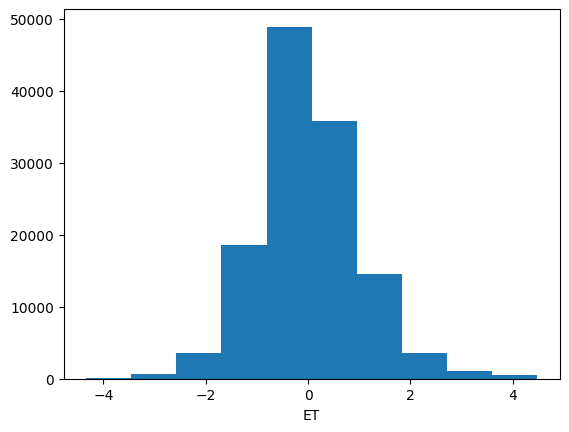

In [100]:
et_clean.plot.hist()

In [101]:
# Compute ECDF for ET
ecdf_et = ECDF(et_clean)

# Compute ECDF for Precipitation
ecdf_precip = ECDF(precip_clean)

# Compute ECDF for TWS
ecdf_twsa = ECDF(tws_clean)


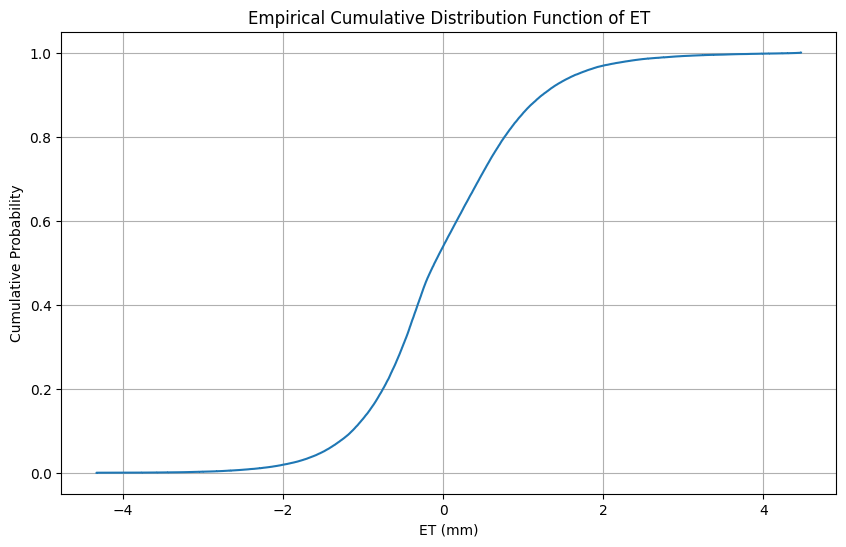

In [102]:
plt.figure(figsize=(10, 6))
plt.step(ecdf_et.x, ecdf_et.y, where='post')
plt.xlabel('ET (mm)')
plt.ylabel('Cumulative Probability')
plt.title('Empirical Cumulative Distribution Function of ET')
plt.grid(True)
plt.show()

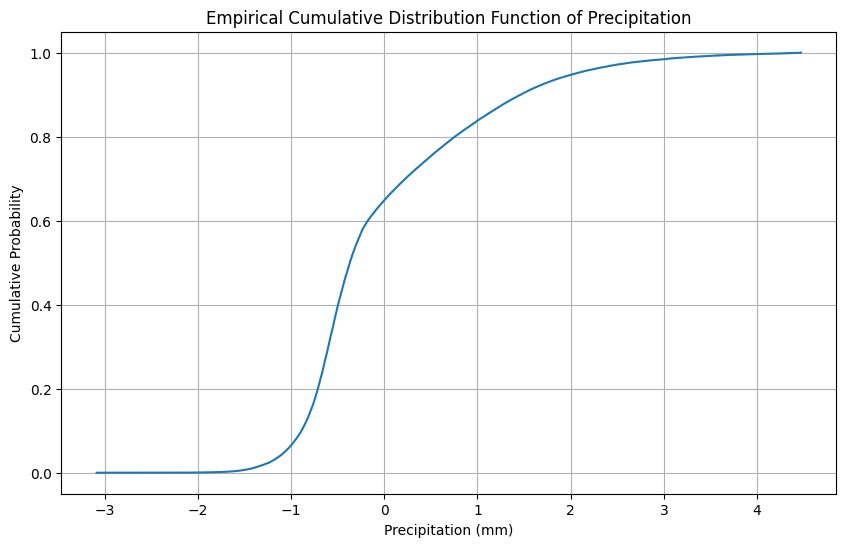

In [103]:
plt.figure(figsize=(10, 6))
plt.step(ecdf_precip.x, ecdf_precip.y, where='post')
plt.xlabel('Precipitation (mm)')
plt.ylabel('Cumulative Probability')
plt.title('Empirical Cumulative Distribution Function of Precipitation')
plt.grid(True)
plt.show()


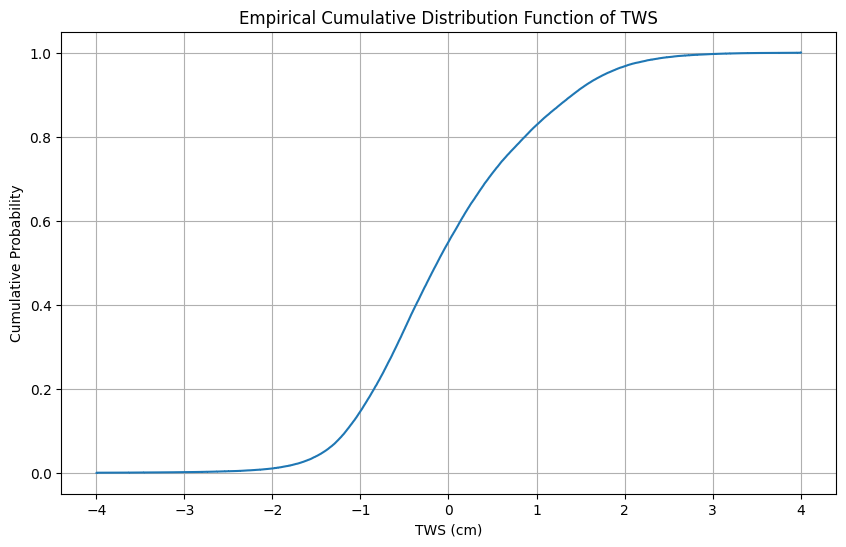

In [104]:
plt.figure(figsize=(10, 6))
plt.step(ecdf_twsa.x, ecdf_twsa.y, where='post')
plt.xlabel('TWS (cm)')
plt.ylabel('Cumulative Probability')
plt.title('Empirical Cumulative Distribution Function of TWS')
plt.grid(True)
plt.show()

#### Transform to uniform margin

In [105]:
# Transform TWSA data
uniform_twsa = ecdf_twsa(tws_clean)

# Transform Precip data
uniform_precip = ecdf_precip(precip_clean)

# Transform ET data
uniform_et = ecdf_et(et_clean)


#### Copula Fitting

In [106]:
# Select subset of the data
uniform_data = np.column_stack([uniform_et[:110000], uniform_precip[:110000], uniform_twsa[:110000]])

In [107]:
# Initialize copulas
copulas = {
    # Elliptical Copulas
    "Gaussian": GaussianCopula(dim=3), 
    "t-Copula": StudentCopula(dim=3),
    
    # Archimidean Copulas
    "Frank": FrankCopula(dim=3),
    "Clayton": ClaytonCopula(dim=3),
    "Gumbel": GumbelCopula(dim=3)
}


In [108]:

results = {}
for name, copula in copulas.items():
    try:
        copula.fit(uniform_data)
        
        # log-likelihood
        log_lik = copula.log_lik(uniform_data)
        
        if name == 't-Copula':
            n_params = copula.params[1].size
        elif name == 'Clayton' or name == 'Gumbel' or name == 'Frank':
            n_params = np.array(copula.params).size
        elif name == 'Gaussian':
            n_params = copula.params.size
        aic = -2 * log_lik + 2 * n_params
        bic = -2 * log_lik + np.log(uniform_data.shape[0]) * n_params
        
        # Calculate AIC and BIC
        # aic = -2 * log_lik + 2 * n_params
        # bic = -2 * log_lik + n_params * np.log(len(u_data))
        
        results[name] = {"Log-Likelihood": log_lik, "AIC": aic, "BIC": bic, "Parameters": copula.params}
        print(f"{name} Copula: Log-Likelihood={log_lik:.2f}, AIC={aic:.2f}, BIC={bic:.2f}")
    except Exception as e:
        print(f"Error fitting {name} Copula: {e}")

# Step 4: Select the best copula
best_copula_aic = min(results.items(), key=lambda x: x[1]["AIC"])
best_copula_bic = min(results.items(), key=lambda x: x[1]["BIC"])

print("\nBest Copula by AIC:")
print(f"Name: {best_copula_aic[0]}, AIC: {best_copula_aic[1]['AIC']:.2f}, Parameters: {best_copula_aic[1]['Parameters']}")
print("Best Copula by BIC:")
print(f"Name: {best_copula_bic[0]}, BIC: {best_copula_bic[1]['BIC']:.2f}, Parameters: {best_copula_bic[1]['Parameters']}")

# Optional: Store the best copula for further use
best_copula_name = best_copula_aic[0]  # or use BIC
best_copula = copulas[best_copula_name]

Gaussian Copula: Log-Likelihood=4.10, AIC=-2.20, BIC=26.63
t-Copula Copula: Log-Likelihood=-3.43, AIC=12.86, BIC=41.68
Frank Copula: Log-Likelihood=2.83, AIC=-3.65, BIC=5.95
Clayton Copula: Log-Likelihood=2.61, AIC=-3.23, BIC=6.38
Gumbel Copula: Log-Likelihood=-0.00, AIC=2.00, BIC=11.61

Best Copula by AIC:
Name: Frank, AIC: -3.65, Parameters: 0.0235988549044977
Best Copula by BIC:
Name: Frank, BIC: 5.95, Parameters: 0.0235988549044977


In [ ]:

# results = []
# for name, copula in copulas.items():
#         log_likelihood = copula.log_lik(uniform_data)
#         if name == 't-Copula':
#             param_size = copula.params[1].size
#         elif name == 'Clayton' or name == 'Gumbel':
#             param_size = np.array(copula.params).size
#             print(param_size)
#         elif name == 'Gaussian':
#             param_size = copula.params.size
#         aic = -2 * log_likelihood + 2 * param_size
#         bic = -2 * log_likelihood + np.log(uniform_data.shape[0]) * param_size
#         results.append({
#             "Copula": name,
#             "Log-Likelihood": log_likelihood,
#             "AIC": aic,
#             "BIC": bic,
#             "Size": param_size
#         })


# # Display results
# import pandas as pd
# results_df = pd.DataFrame(results)
# print(results_df)

In [ ]:
# lower_tail = np.mean((u_data[:, 0] < 0.1) & (u_data[:, 1] < 0.1))
# print(f"Observed Lower Tail Dependence: {lower_tail:.3f}")

In [109]:
best_copula

### Tail

In [113]:

et = et_clean.values[:110000]
tws = tws_clean.values[:110000]
precip = precip_clean.values[:110000]  # Replace with your Precip data

# Or if your data is in a CSV, load it like this:
# df = pd.read_csv('your_data.csv')
# et = df['et'].values
# tws = df['tws'].values
# precip = df['precip'].values

# Put data into a DataFrame for convenience
data = pd.DataFrame({'ET': et, 'TWS': tws, 'Precip': precip})


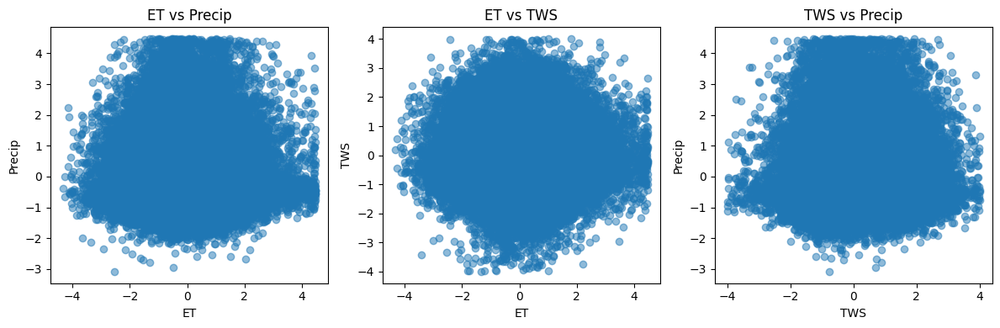

In [114]:

# 1. Pairwise Scatterplots
plt.figure(figsize=(12, 4))

# ET vs Precip
plt.subplot(1, 3, 1)
plt.scatter(data['ET'], data['Precip'], alpha=0.5)
plt.xlabel('ET')
plt.ylabel('Precip')
plt.title('ET vs Precip')

# ET vs TWS
plt.subplot(1, 3, 2)
plt.scatter(data['ET'], data['TWS'], alpha=0.5)
plt.xlabel('ET')
plt.ylabel('TWS')
plt.title('ET vs TWS')

# TWS vs Precip
plt.subplot(1, 3, 3)
plt.scatter(data['TWS'], data['Precip'], alpha=0.5)
plt.xlabel('TWS')
plt.ylabel('Precip')
plt.title('TWS vs Precip')

plt.tight_layout()
plt.show()



In [115]:
# 2. Kendall’s Tau Correlation
pairs = [('ET', 'Precip'), ('ET', 'TWS'), ('TWS', 'Precip')]
print("\nKendall's Tau Correlations:")
for var1, var2 in pairs:
    tau, p_value = kendalltau(data[var1], data[var2])
    print(f"{var1} vs {var2}: Tau = {tau:.3f}, p-value = {p_value:.3f}")
    # Note: p-value < 0.05 suggests significant dependence



Kendall's Tau Correlations:
ET vs Precip: Tau = 0.004, p-value = 0.059
ET vs TWS: Tau = 0.002, p-value = 0.237
TWS vs Precip: Tau = 0.003, p-value = 0.175



Tail Dependence Estimates (10% tails):
ET vs Precip: Lower Tail = 0.112, Upper Tail = 0.099
ET vs TWS: Lower Tail = 0.099, Upper Tail = 0.100
TWS vs Precip: Lower Tail = 0.095, Upper Tail = 0.099


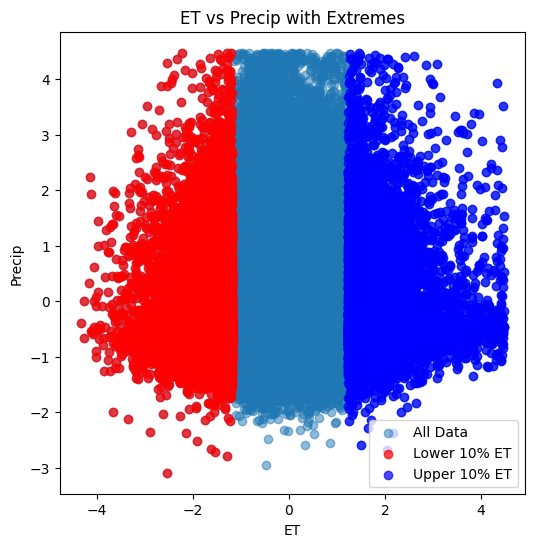

In [116]:
# 3. Tail Dependence Check (Lower and Upper 10%)
def check_tail_dependence(x, y, tail_percent=0.1):
    n = len(x)
    threshold = int(n * tail_percent)
    
    # Sort data and get extremes
    sorted_indices = np.argsort(x)
    x_sorted = x[sorted_indices]
    y_sorted = y[sorted_indices]
    
    # Lower tail: P(Y < low | X < low)
    lower_x = x_sorted[:threshold]
    lower_y = y_sorted[:threshold]
    lower_count = np.sum(lower_y < np.percentile(y, 10))  # Y also in bottom 10%
    lambda_lower = lower_count / threshold
    
    # Upper tail: P(Y > high | X > high)
    upper_x = x_sorted[-threshold:]
    upper_y = y_sorted[-threshold:]
    upper_count = np.sum(upper_y > np.percentile(y, 90))  # Y also in top 10%
    lambda_upper = upper_count / threshold
    
    return lambda_lower, lambda_upper

print("\nTail Dependence Estimates (10% tails):")
for var1, var2 in pairs:
    lambda_l, lambda_u = check_tail_dependence(data[var1].values, data[var2].values)
    print(f"{var1} vs {var2}: Lower Tail = {lambda_l:.3f}, Upper Tail = {lambda_u:.3f}")
    # If lambda > 0, there's tail dependence; closer to 1 means stronger

# Optional: Highlight extremes in scatterplot (e.g., ET vs Precip)
plt.figure(figsize=(6, 6))
plt.scatter(data['ET'], data['Precip'], alpha=0.5, label='All Data')
# Lower 10% of ET
low_et_mask = data['ET'] < np.percentile(data['ET'], 10)
plt.scatter(data['ET'][low_et_mask], data['Precip'][low_et_mask], 
            color='red', label='Lower 10% ET', alpha=0.7)
# Upper 10% of ET
high_et_mask = data['ET'] > np.percentile(data['ET'], 90)
plt.scatter(data['ET'][high_et_mask], data['Precip'][high_et_mask], 
            color='blue', label='Upper 10% ET', alpha=0.7)
plt.xlabel('ET')
plt.ylabel('Precip')
plt.title('ET vs Precip with Extremes')
plt.legend()
plt.show()

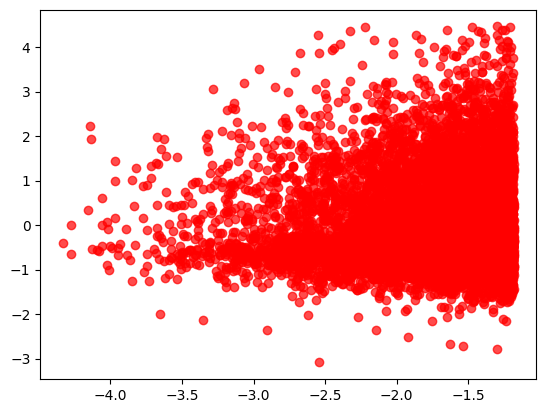

In [117]:
low_et_mask = data['ET'] < np.percentile(data['ET'], 10)
plt.scatter(data['ET'][low_et_mask], data['Precip'][low_et_mask], 
            color='red', label='Lower 10% ET', alpha=0.7)

### Validate the Selected Copula


In [171]:
# Simulate new uniform marginals from the copula
simulated_data_gaussian = best_copula.random(50000)

In [172]:
simulated_data_gaussian

array([[0.37258901, 0.10033688, 0.56819878],
       [0.412562  , 0.18241699, 0.42750862],
       [0.79927   , 0.17003931, 0.36931428],
       ...,
       [0.08424944, 0.39968534, 0.5757452 ],
       [0.108803  , 0.54274006, 0.65177201],
       [0.2983367 , 0.45109212, 0.56722461]])

In [173]:
# Validate all pairs
pairs = [("ET", "Precip", 0, 1), ("ET", "TWS", 0, 2), ("Precip", "TWS", 1, 2)]
for var1, var2, idx1, idx2 in pairs:
    tau_obs = kendalltau(uniform_data[:, idx1], uniform_data[:, idx2])[0]
    tau_sim = kendalltau(simulated_data_gaussian[:, idx1], simulated_data_gaussian[:, idx2])[0]
    print(f"Observed Tau ({var1}-{var2}): {tau_obs:.3f}, Simulated Tau: {tau_sim:.3f}")

Observed Tau (ET-Precip): 0.004, Simulated Tau: nan
Observed Tau (ET-TWS): 0.002, Simulated Tau: nan
Observed Tau (Precip-TWS): 0.003, Simulated Tau: nan


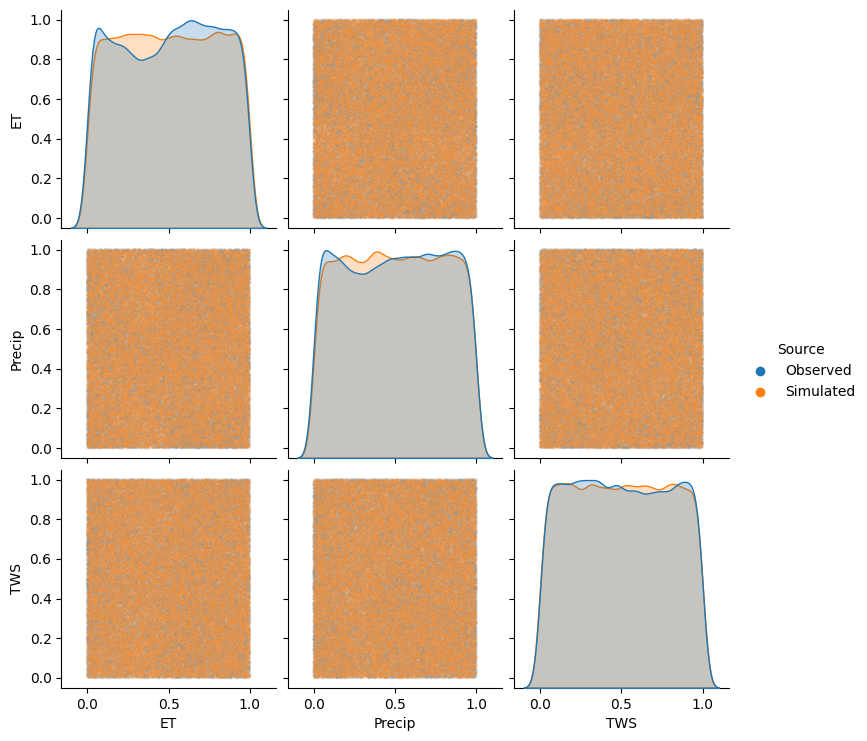

In [27]:
observed_df = pd.DataFrame(uniform_data, columns=["ET", "Precip", "TWS"])
observed_df["Source"] = "Observed"
simulated_df = pd.DataFrame(simulated_data_gaussian, columns=["ET", "Precip", "TWS"])
simulated_df["Source"] = "Simulated"
combined_df = pd.concat([observed_df.sample(50000, random_state=42), simulated_df])
sns.pairplot(combined_df, hue="Source", diag_kind="kde", plot_kws={"alpha": 0.1, "s": 5})
plt.show()

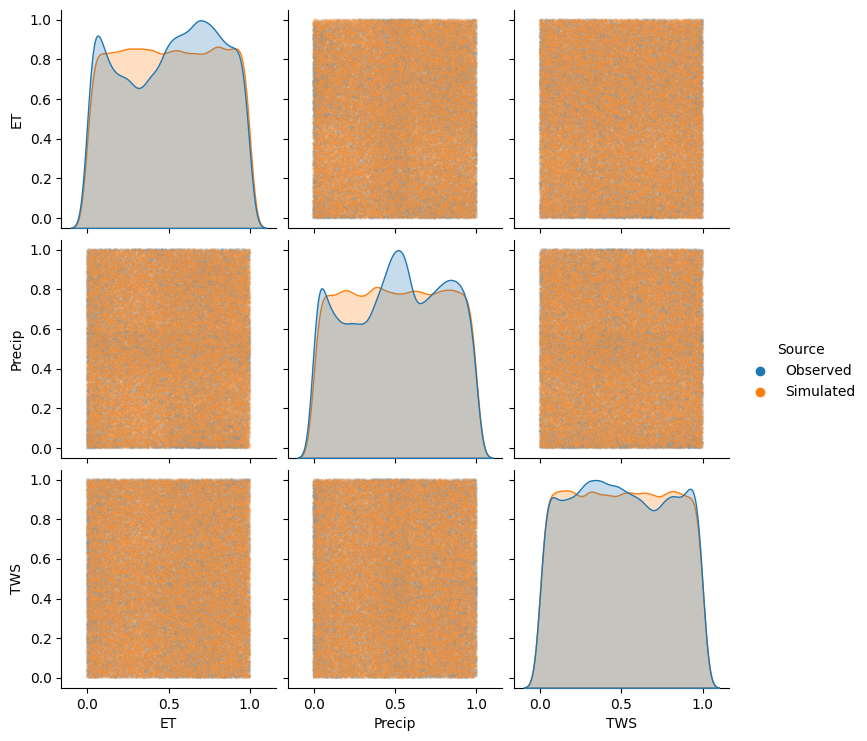

In [31]:
combined_dfn = pd.concat([observed_df[:50000], simulated_df])
sns.pairplot(combined_dfn, hue="Source", diag_kind="kde", plot_kws={"alpha": 0.1, "s": 5})
plt.show()

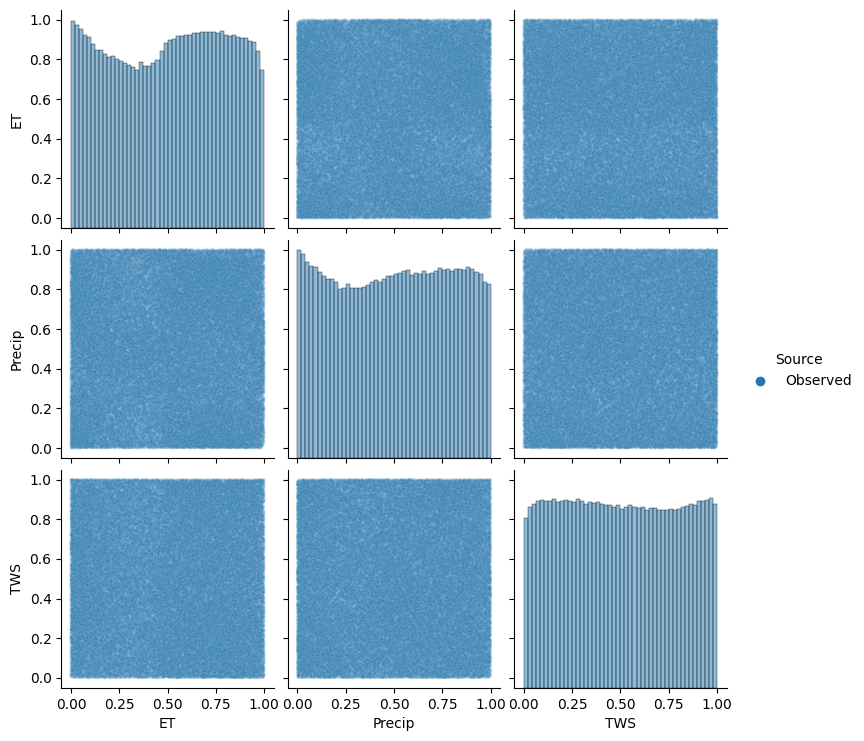

In [36]:
sns.pairplot(observed_df, hue="Source", diag_kind="hist", plot_kws={"alpha": 0.1, "s": 5})
plt.show()

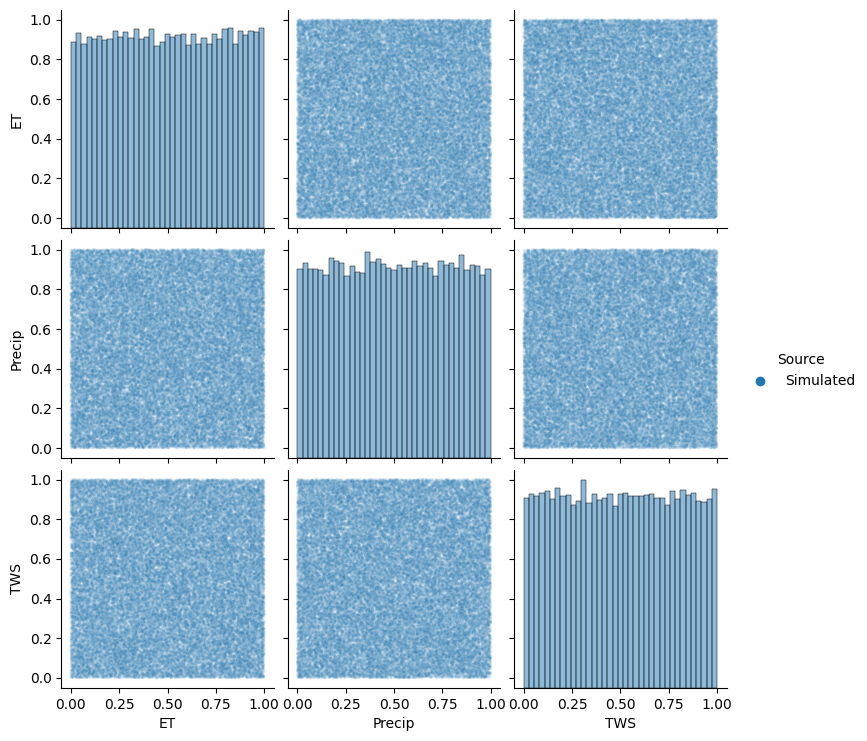

In [35]:
sns.pairplot(simulated_df, hue="Source", diag_kind="hist", plot_kws={"alpha": 0.1, "s": 5})
plt.show()

In [48]:
drought_events

array([[0.07800429, 0.00426442, 0.11844916],
       [0.08603512, 0.16919737, 0.02496361],
       [0.07280922, 0.13577538, 0.15040743],
       ...,
       [0.04641898, 0.0855697 , 0.00783366],
       [0.07619314, 0.12756958, 0.10820155],
       [0.04460953, 0.03817487, 0.12419446]])

In [47]:
threshold = 0.2  # 20th percentile
drought_events = simulated_data_gaussian[np.all(simulated_data_gaussian < threshold, axis=1)]
drought_prob = drought_events.mean()
se = np.sqrt(drought_prob * (1 - drought_prob) / 50000)
print(f"Drought Probability (all < {threshold}): {drought_prob:.3f} ± {1.96 * se:.3f}")

Drought Probability (all < 0.2): 0.101 ± 0.003


In [81]:
drought_prob

0.10074512517642416

In [55]:
# Moderate drought
moderate_drought = simulated_data_gaussian[np.all(simulated_data_gaussian < 0.2, axis=1)]
print(f"Moderate drought samples: {len(moderate_drought)}, Prob: {len(moderate_drought)/100000:.3f}")

# Severe drought
severe_drought = simulated_data_gaussian[np.all(simulated_data_gaussian < 0.1, axis=1)]
print(f"Severe drought samples: {len(severe_drought)}, Prob: {len(severe_drought)/100000:.3f}")

# Extreme drought
extreme_drought = simulated_data_gaussian[np.all(simulated_data_gaussian < 0.05, axis=1)]
print(f"Extreme drought samples: {len(extreme_drought)}, Prob: {len(extreme_drought)/100000:.3f}")

Moderate drought samples: 388, Prob: 0.004
Severe drought samples: 45, Prob: 0.000
Extreme drought samples: 8, Prob: 0.000


In [79]:
# Define a drought threshold (e.g., 20th percentile)
threshold_et = np.percentile(uniform_data[:, 0], 20)
threshold_precip = np.percentile(uniform_data[:, 1], 20)
threshold_tws = np.percentile(uniform_data[:, 2], 20)

# Count occurrences where all three conditions are met
drought_count = np.sum(
    (simulated_data_gaussian[:, 0] < threshold_et) &
    (simulated_data_gaussian[:, 1] < threshold_precip) &
    (simulated_data_gaussian[:, 2] < threshold_tws)
)

# Estimate Probability
drought_probability = drought_count / len(simulated_data_gaussian[:, 0])
print(f"Estimated Drought Probability: {drought_probability:.4f}")


Estimated Drought Probability: 0.0072


Observed Tau (ET-Precip): 0.004
Simulated Tau (ET-Precip): 0.006


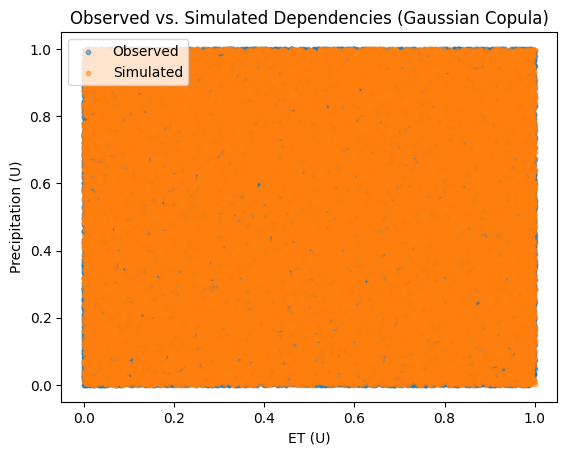

In [32]:
# Assuming u_data is your observed uniform margins from earlier
# u_data shape: (n_samples, 3) for ET, precip, TWS

# Generate simulated samples
# simulated_data_gaussian = gaussian_copula.random(1000)  # Shape: (1000, 3)

# Compare Kendall’s tau (dependency measure)
tau_obs_et_precip = kendalltau(uniform_data[:, 0], uniform_data[:, 1])[0]
tau_sim_et_precip = kendalltau(simulated_data_gaussian[:, 0], simulated_data_gaussian[:, 1])[0]
print(f"Observed Tau (ET-Precip): {tau_obs_et_precip:.3f}")
print(f"Simulated Tau (ET-Precip): {tau_sim_et_precip:.3f}")

# Visualize observed vs. simulated
plt.scatter(uniform_data[:, 0], uniform_data[:, 1], alpha=0.5, label="Observed", s=10)
plt.scatter(simulated_data_gaussian[:, 0], simulated_data_gaussian[:, 1], alpha=0.5, label="Simulated", s=10)
plt.xlabel("ET (U)")
plt.ylabel("Precipitation (U)")
plt.legend()
plt.title("Observed vs. Simulated Dependencies (Gaussian Copula)")
plt.show()

In [83]:
(uniform_data)

array([[0.92326552, 0.22411111, 0.07342862],
       [0.7462615 , 0.3274127 , 0.3728261 ],
       [0.67441477, 0.58372222, 0.16553637],
       ...,
       [0.29926055, 0.30216667, 0.21297272],
       [0.51014875, 0.89389683, 0.55275459],
       [0.6130429 , 0.05560317, 0.6618843 ]])

In [60]:
# Compute log-likelihood of the fitted copula
log_likelihood = guassian_copula.log_lik(uniform_data)
print(f"Log-Likelihood: {log_likelihood}")

# Compute AIC & BIC (lower values indicate better fit)
num_params = guassian_copula.params.size  # Number of parameters in copula
aic = -2 * log_likelihood + 2 * num_params
bic = -2 * log_likelihood + np.log(111000) * num_params

print(f"AIC: {aic}, BIC: {bic}")


Log-Likelihood: 4.098253271287421
AIC: -2.1965065425748413, BIC: 26.655349898308575


In [63]:
from scipy.stats import norm

# Convert uniform samples back to real-world values
et_simulated = ecdf_et(simulated_data_gaussian[:, 0])
precip_simulated = ecdf_precip(simulated_data_gaussian[:, 1])
tws_simulated = ecdf_twsa(simulated_data_gaussian[:, 2])


In [64]:
# Example: Simple average-based CDI
cdi = (et_simulated + precip_simulated + tws_simulated) / 3

# Normalize CDI to standard scores
cdi_standardized = (cdi - np.mean(cdi)) / np.std(cdi)


In [ ]:
plt.figure(figsize=(12, 5))
plt.plot(et_data['time'], cdi_standardized, label="Copula-based Drought Index (CDI)", color='b')
plt.axhline(0, color='red', linestyle='--')
plt.xlabel("Time")
plt.ylabel("CDI (Standardized)")
plt.title("Copula-based Drought Index Over Time")
plt.legend()
plt.show()


In [ ]:
# Calculating probabilities for specific scenarios and checking if they make sense.



In [57]:
# Define thresholds
a = np.quantile(et_clean, 0.1)  # 90th percentile for ET
b = np.quantile(precip_clean, 0.9)  # 90th percentile for Precipitation
c = np.quantile(tws_clean, 0.9)  # 90th percentile for TWSA

# Transform thresholds to uniform scale
u_a = ecdf_et(a)
u_b = ecdf_precip(b)
u_c = ecdf_twsa(c)

# Compute joint probability using the copula
joint_probability = guassian_copula.cdf([u_a, u_b, u_c])
print(f"Joint probability: {joint_probability}")

Joint probability: 0.08109321354922804


In [367]:
# Define thresholds
x = 50  # ET threshold
y = 100  # Precipitation threshold
z = -50  # TWS threshold

# Transform thresholds to uniform scale
u_x = ecdf_et(x)
u_y = ecdf_precip(y)
u_z = ecdf_twsa(z)

# Calculate joint probability
prob = copula.cdf([u_x, u_y, u_z])
print(f"Probability: {prob}")

Probability: 0.0


In [366]:
# Define thresholds
x = 2  # ET threshold
y = 1  # Precipitation threshold
z = 3  # TWS threshold

# Transform thresholds to uniform scale
u_x = 1 - ecdf_et(x)  # ET > x
u_y = ecdf_precip(y)  # Precipitation < y
u_z = 1 - ecdf_twsa(z)  # TWS > z

# Calculate joint probability
prob = copula.cdf([u_x, u_y, u_z])
print(f"Probability: {prob}")

Probability: 8.610569886367593e-05


In [201]:
et_changes = et_nairobi.diff(dim="time")
precip_changes = precip_nairobi.diff(dim="time")
tws_changes = tws_nairobi.diff(dim="time")

print("Std of monthly changes:")
print("ET:", et_changes.std().item())
print("Precipitation:", precip_changes.std().item())
print("TWS:", tws_changes.std().item())

Std of monthly changes:
ET: 1.1279466079985916
Precipitation: 1.4162964820861816
TWS: 0.5950899584599952


### Goodness of fit 

In [313]:
from scipy.stats import kstest

def goodness_of_fit(copula, data):
    
    theoretical_cdf = copula.random(len(data))
    # Perform KS test
    ks_stat, p_value = kstest(data.flatten(), theoretical_cdf.flatten())
    return ks_stat, p_value

# Evaluate each copula
results = {}
for name, copula in copulas.items():
    ks_stat, p_value = goodness_of_fit(copula, uniform_data)
    results[name] = {'KS Statistic': ks_stat, 'p-value': p_value}

# Print results
for name, result in results.items():
    print(f"{name}: KS Statistic = {result['KS Statistic']}, p-value = {result['p-value']}")

Gaussian: KS Statistic = 0.02044666666666667, p-value = 1.1430997655077774e-27
t-Copula: KS Statistic = 0.01923999999999998, p-value = 1.5088038275012942e-24
Gumbel: KS Statistic = 0.019993333333333363, p-value = 1.7893862380351054e-26
Clayton: KS Statistic = 0.020893333333333375, p-value = 7.158625337067697e-29


In [119]:
from scipy.stats import kstest

def goodness_of_fit(copula, data):
    
    theoretical_cdf = copula.random(len(data))
    # Perform KS test
    ks_stat, p_value = kstest(data.flatten(), theoretical_cdf.flatten())
    return ks_stat, p_value

# Evaluate each copula
results = {}
for name, copula in copulas.items():
    ks_stat, p_value = goodness_of_fit(copula, uniform_data)
    results[name] = {'KS Statistic': ks_stat, 'p-value': p_value}

# Print results
for name, result in results.items():
    print(f"{name}: KS Statistic = {result['KS Statistic']}, p-value = {result['p-value']}")

Gaussian: KS Statistic = 0.00978787878787879, p-value = 3.6963063266504564e-14
t-Copula: KS Statistic = 0.009963636363636341, p-value = 1.1753674791520968e-14
Frank: KS Statistic = 0.010172727272727278, p-value = 2.9286943360064136e-15
Clayton: KS Statistic = 0.00808181818181819, p-value = 8.663486147137748e-10
Gumbel: KS Statistic = 0.010160606060606092, p-value = 3.1768868732765164e-15


#####  Test the copulas

In [314]:
# Compute log-likelihood, AIC, and BIC for each copula

results = []
for name, copula in copulas.items():
        log_likelihood = copula.log_lik(uniform_data)
        if name == 't-Copula':
            param_size = copula.params[1].size
        elif name == 'Clayton' or name == 'Gumbel':
            param_size = np.array(copula.params).size
            print(param_size)
        elif name == 'Gaussian':
            param_size = copula.params.size
        aic = -2 * log_likelihood + 2 * param_size
        bic = -2 * log_likelihood + np.log(uniform_data.shape[0]) * param_size
        results.append({
            "Copula": name,
            "Log-Likelihood": log_likelihood,
            "AIC": aic,
            "BIC": bic,
            "Size": param_size
        })


# Display results
import pandas as pd
results_df = pd.DataFrame(results)
print(results_df)

1
1
     Copula  Log-Likelihood       AIC        BIC  Size
0  Gaussian        5.771486 -5.542971  20.916363     3
1  t-Copula        1.240248  3.519504  29.978839     3
2    Gumbel       -0.000144  2.000289  10.820067     1
3   Clayton        1.532401 -1.064802   7.754976     1


### Create the drought Index

In [144]:
for i, lat in enumerate(tws_st_anomalies.lat.values):
    for j, lon in enumerate(tws_st_anomalies.lon.values):
        try:
            et_data = et_st_anomalies[:219].sel(lat=lat, lon=lon, method="nearest").values
            precip_data = pre_st_anomalies[:219].sel(lat=lat, lon=lon, method="nearest").values
            tws_data = tws_st_anomalies.sel(lat=lat, lon=lon, method="nearest").values
            data = np.vstack([et_data, precip_data, tws_data]).T
            valid_mask = ~np.isnan(data).any(axis=1)
            if valid_mask.sum() == 0:
                # print(f"No valid data at lat={lat}, lon={lon}")
                continue
            data_clean = data[valid_mask]
            u_data_local = np.vstack([ECDF(data_clean[:, k])(data_clean[:, k]) for k in range(3)]).T
            # u_data_local = np.clip(u_data_local, 0.001, 0.999)
            joint_cdf = best_copula.cdf(u_data_local)
            drought_index.values[valid_mask, i, j] = joint_cdf
            # print(f"Lat={lat}, Lon={lon}, CDF sample: {joint_cdf[:5]}")
        except Exception as e:
            print(f"Error at lat={lat}, lon={lon}: {e}")

In [145]:
drought_index_standardized = xr.apply_ufunc(norm.ppf, drought_index, keep_attrs=True).rename("Drought Index")

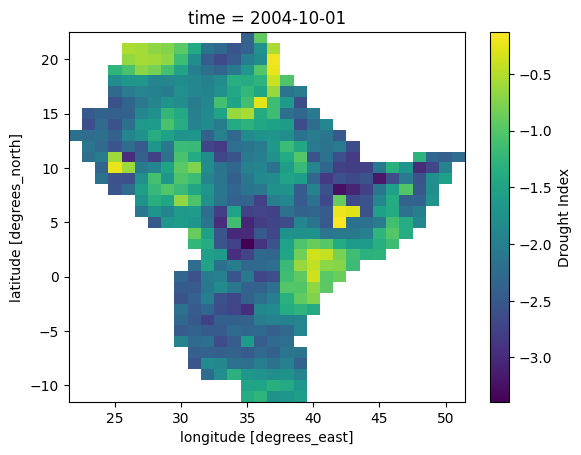

In [ ]:
drought_index_standardized.isel(time=9).plot()

In [147]:
# Verify
print("Drought Index Min/Max:", drought_index_standardized.min().item(), drought_index_standardized.max().item())
print("Any non-NaN values?", drought_index_standardized.notnull().any().item())
print("Sample values:", drought_index_standardized.isel(time=0, lat=0, lon=0).values)

Drought Index Min/Max: -4.250521331571198 1.7903697161482826
Any non-NaN values? True
Sample values: nan


In [148]:
print("Sample values:", drought_index_standardized.isel(time=44, lat=11, lon=22))

Sample values: <xarray.DataArray 'Drought Index' ()>
array(nan)
Coordinates:
    time     datetime64[ns] 2007-09-01
    lat      float64 0.0
    lon      float64 44.0


In [149]:
print("Any non-NaN values?", drought_index_standardized.notnull().any().item())
print("Fraction of non-NaN values:", drought_index_standardized.notnull().mean().item())
print("Sample at a grid point:", drought_index_standardized.sel(lat=-1.3, lon=36.9, method="nearest").values[:5])

Any non-NaN values? True
Fraction of non-NaN values: 0.4918614020950846
Sample at a grid point: [ 0.10572048 -1.76943363 -0.7324962  -1.75412838 -0.72276642]


### Spatial Analysis

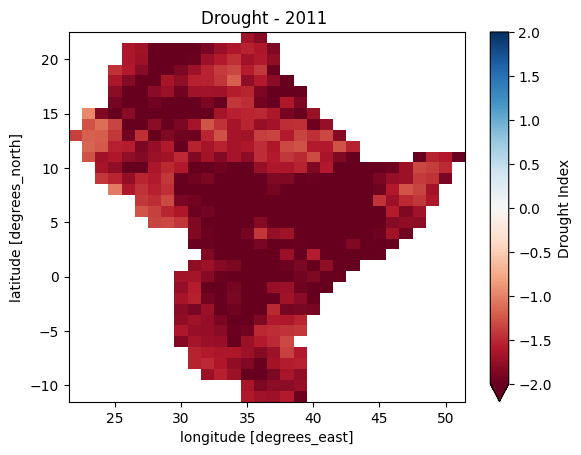

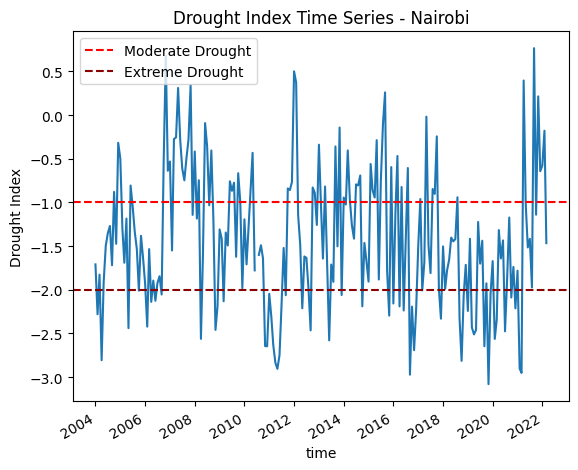

In [214]:
# Spatial map for 2011 drought 
drought_index_standardized.sel(time=slice("2011-01-01", "2011-05-31")).mean(dim="time").plot(
    robust=True, cmap="RdBu", vmin=-2, vmax=2
)
plt.title("Drought - 2011 ")
plt.show()

# Time series at Nairobi (~1.3°S, 36.9°E)
drought_index_standardized.sel(lat=0, lon=42, method="nearest").plot()
plt.title("Drought Index Time Series - Nairobi")
plt.axhline(y=-1, color='r', linestyle='--', label="Moderate Drought")
plt.axhline(y=-2, color='darkred', linestyle='--', label="Extreme Drought")
plt.legend()
plt.show()

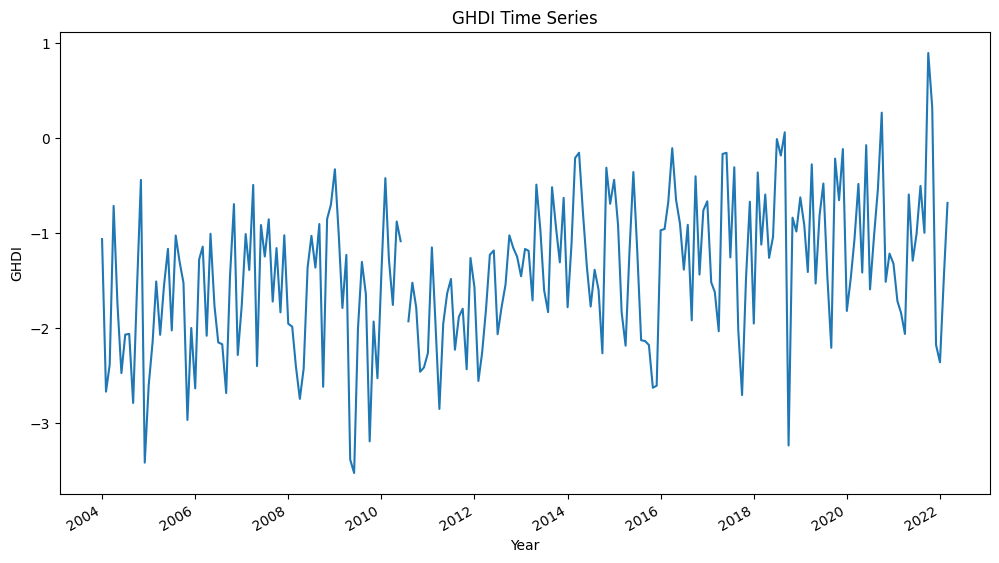

In [207]:
plt.figure(figsize=(12, 6))  # Adjust width and height as needed
drought_index_standardized.sel(lat=9, lon=38.7, method="nearest").plot()
plt.title("GHDI Time Series")
plt.xlabel("Year")
plt.ylabel("GHDI")
# plt.title("Time Series Plot")
# plt.ylim(-3, 3) 
plt.show()
# -1.3, 36.9

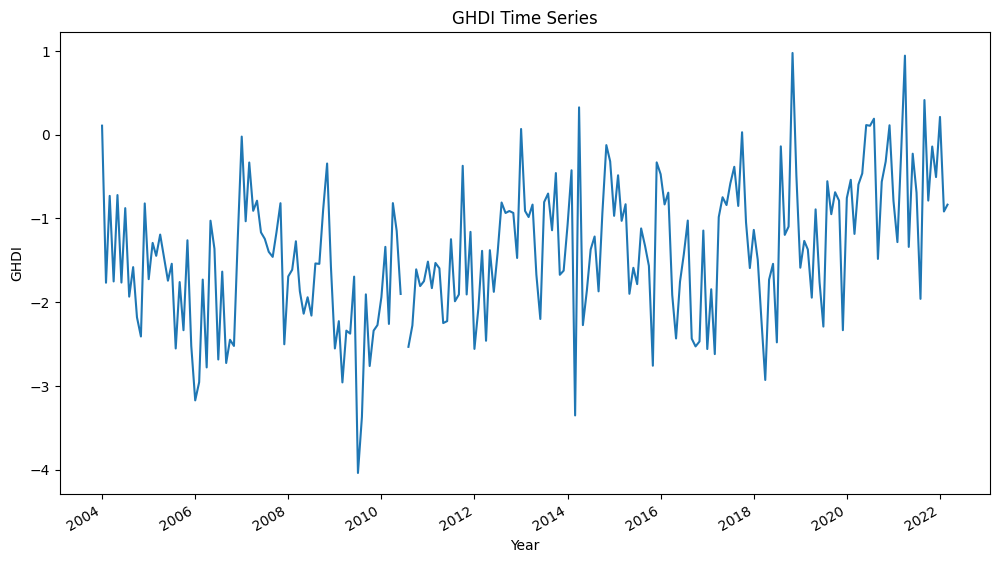

In [206]:
plt.figure(figsize=(12, 6))  # Adjust width and height as needed
drought_index_standardized.sel(lat=-1.3, lon=36.9, method="nearest").plot()
plt.title("GHDI Time Series")
plt.xlabel("Year")
plt.ylabel("GHDI")
# plt.title("Time Series Plot")
# plt.ylim(-3, 3) 
plt.show()
# -1.3, 36.9
# 2.0, 45.3

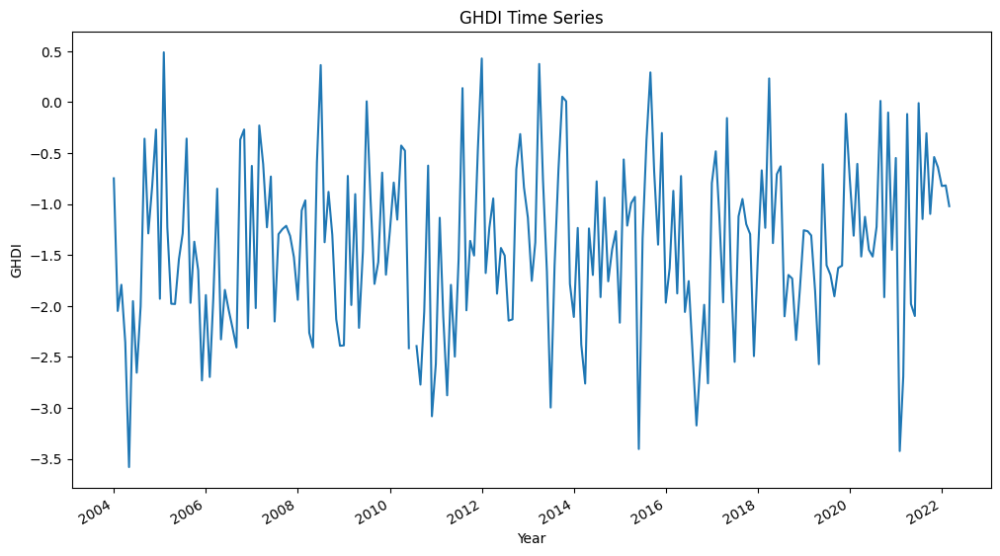

In [208]:
plt.figure(figsize=(12, 6))  # Adjust width and height as needed
drought_index_standardized.sel(lat=2, lon=45.3, method="nearest").plot()
plt.title("GHDI Time Series")
plt.xlabel("Year")
plt.ylabel("GHDI")
# plt.title("Time Series Plot")
# plt.ylim(-3, 3) 
plt.show()
# -1.3, 36.9
# 2.0, 45.3

In [187]:
ghdi_smoothed_3 = drought_index_standardized.rolling(time=3, center=True).mean()


In [198]:
ghdi_smoothed_3_nairobi = drought_index_standardized.sel(lat=-1.3, lon=36.9, method="nearest")

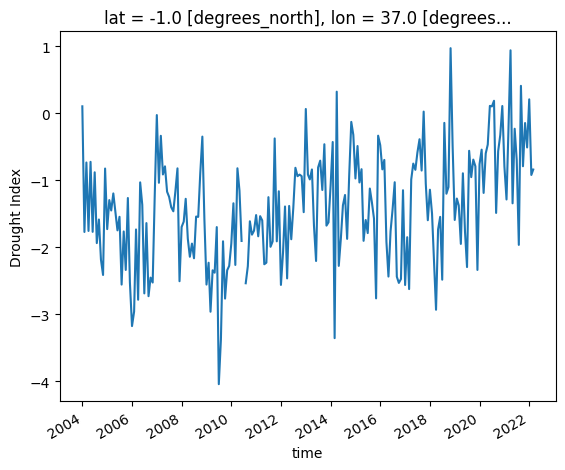

In [199]:
ghdi_smoothed_3_nairobi.plot()

In [186]:
drought_threshold = 0.2

# Validate with drought threshold
z_score_threshold = norm.ppf(drought_threshold)  # ~ -0.84 for 0.2
drought_fraction = (drought_index_standardized < z_score_threshold).mean().item()
print(f"Drought Fraction (< {z_score_threshold:.2f}): {drought_fraction:.3f}")

# Simulate to check probability
simulated_data_gaussian = best_copula.random(50000)
drought_prob = np.all(simulated_data_gaussian < drought_threshold, axis=1).mean()
se = np.sqrt(drought_prob * (1 - drought_prob) / 50000)
print(f"Simulated Drought Prob (all < {drought_threshold}): {drought_prob:.3f} ± {1.96 * se:.3f}")

Drought Fraction (< -0.84): 0.373
Simulated Drought Prob (all < 0.2): 0.009 ± 0.001


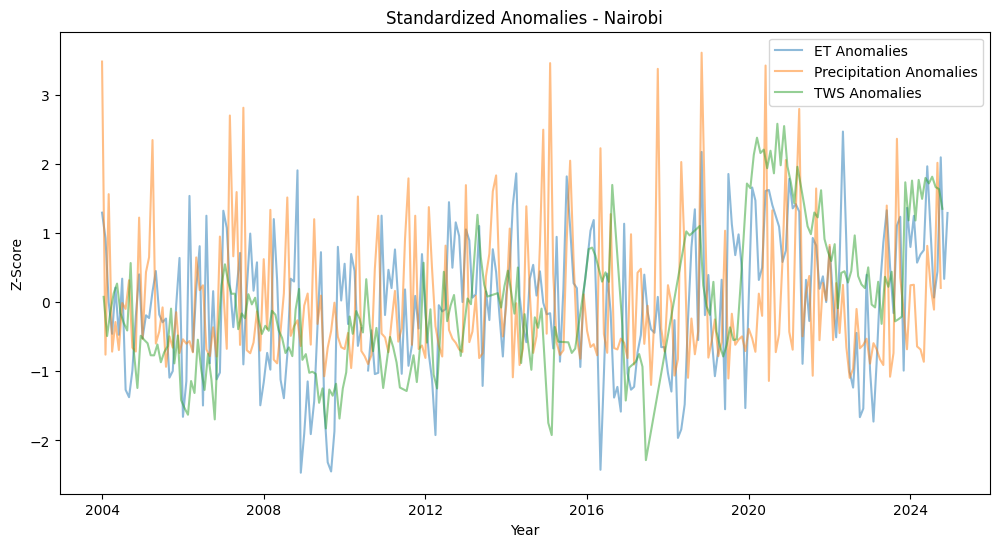

Std of monthly changes:
ET: 1.1279466079985916
Precipitation: 1.4162964820861816
TWS: 0.5950899584599952


In [192]:
nairobi_lat, nairobi_lon = -1.3, 36.9

et_nairobi = et_st_anomalies.sel(lat=nairobi_lat, lon=nairobi_lon, method="nearest")
precip_nairobi = pre_st_anomalies.sel(lat=nairobi_lat, lon=nairobi_lon, method="nearest")
tws_nairobi = tws_st_anomalies.sel(lat=nairobi_lat, lon=nairobi_lon, method="nearest")

# Plot time series
plt.figure(figsize=(12, 6))
plt.plot(et_nairobi.time, et_nairobi, label="ET Anomalies", alpha=0.5)
plt.plot(precip_nairobi.time, precip_nairobi, label="Precipitation Anomalies", alpha=0.5)
plt.plot(tws_nairobi.time, tws_nairobi, label="TWS Anomalies", alpha=0.5)
plt.title("Standardized Anomalies - Nairobi")
plt.xlabel("Year")
plt.ylabel("Z-Score")
plt.legend()
plt.show()

# Compute standard deviation of monthly changes
et_changes = et_nairobi.diff(dim="time")
precip_changes = precip_nairobi.diff(dim="time")
tws_changes = tws_nairobi.diff(dim="time")

print("Std of monthly changes:")
print("ET:", et_changes.std().item())
print("Precipitation:", precip_changes.std().item())
print("TWS:", tws_changes.std().item())

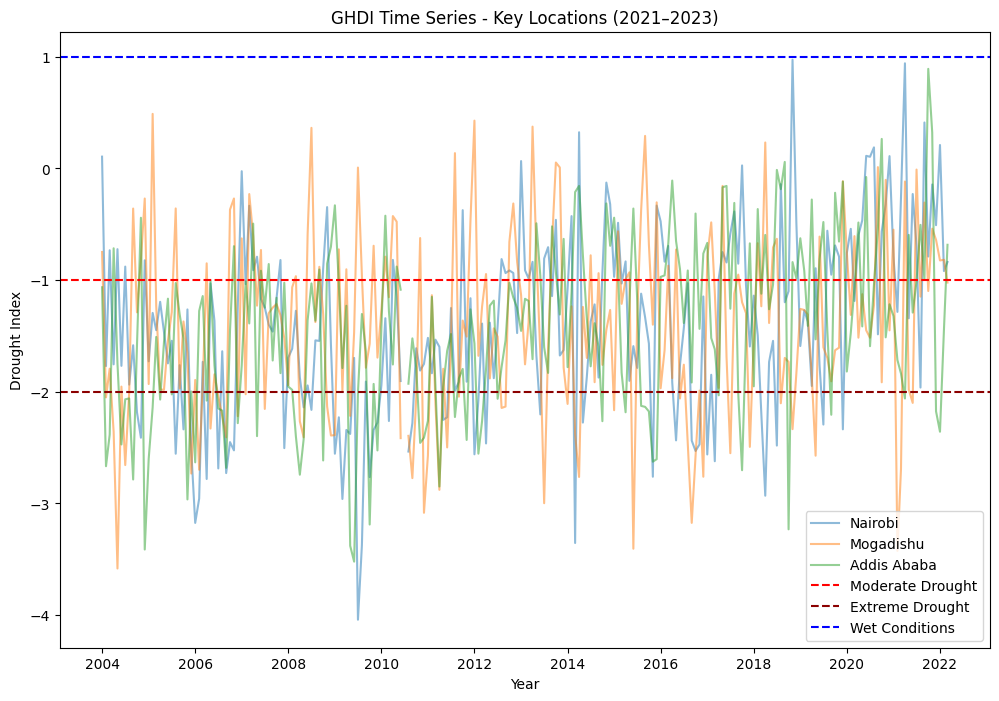

In [194]:
# Define key locations (e.g., Nairobi, Mogadishu, Addis Ababa)
locations = {
    "Nairobi": (-1.3, 36.9),
    "Mogadishu": (2.0, 45.3),
    "Addis Ababa": (9.0, 38.7)
}

plt.figure(figsize=(12, 8))
for name, (lat, lon) in locations.items():
    ghdi_loc = drought_index_standardized.sel(lat=lat, lon=lon, method="nearest")
    plt.plot(ghdi_loc.time, ghdi_loc, label=name, alpha=0.5)
plt.axhline(y=-1, color='r', linestyle='--', label="Moderate Drought")
plt.axhline(y=-2, color='darkred', linestyle='--', label="Extreme Drought")
plt.axhline(y=1, color='b', linestyle='--', label="Wet Conditions")
plt.title("GHDI Time Series - Key Locations (2021–2023)")
plt.xlabel("Year")
plt.ylabel("Drought Index")
plt.legend()
# plt.xlim("2021-01-01", "2023-12-31")
plt.show()

Fraction of non-NaN values: 0.4918614020950846
Full Min/Max (unclipped): -4.250521331571198 1.7903697161482826


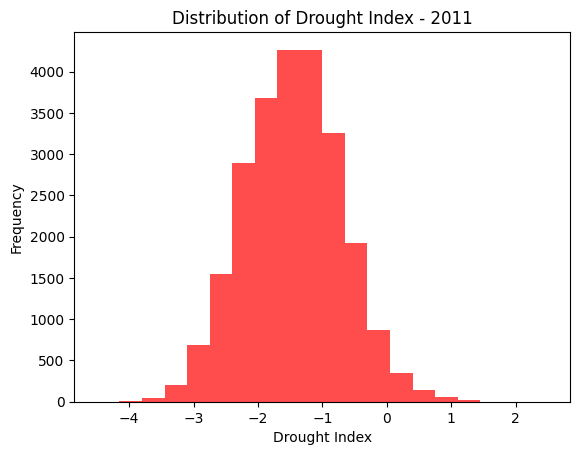

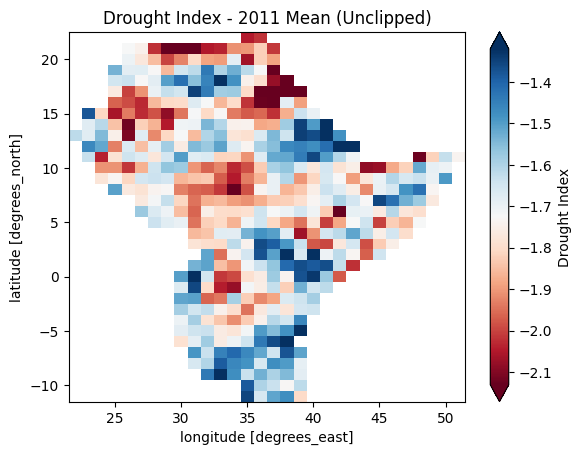

In [215]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

# Verify non-NaN coverage
print("Fraction of non-NaN values:", drought_index_standardized.notnull().mean().item())
print("Full Min/Max (unclipped):", drought_index_standardized.min().item(), drought_index_standardized.max().item())

# Histogram of 2011 values to check distribution
drought_2011 = drought_index_standardized.sel(time=slice("2011-01-01", "2014-12-31")).values.flatten()
plt.hist(drought_2011[~np.isnan(drought_2011)], bins=20, range=(-4.5, 2.5), color='red', alpha=0.7)
plt.title("Distribution of Drought Index - 2011")
plt.xlabel("Drought Index")
plt.ylabel("Frequency")
plt.show()

# Spatial map without clipping
drought_index_standardized.sel(time=slice("2011-01-01", "2011-12-31")).mean(dim="time").plot(
    robust=True, cmap="RdBu"
)
plt.title("Drought Index - 2011 Mean (Unclipped)")
plt.show()

## New Trail

In [414]:
# Transform back to the original scales using the inverse ECDFs
student_simulated_et = np.quantile(et_clean, simulated_uniform_student[:, 0])
student_simulated_precip = np.quantile(precip_clean, simulated_uniform_student[:, 1])
student_simulated_twsa = np.quantile(tws_clean, simulated_uniform_student[:, 2])

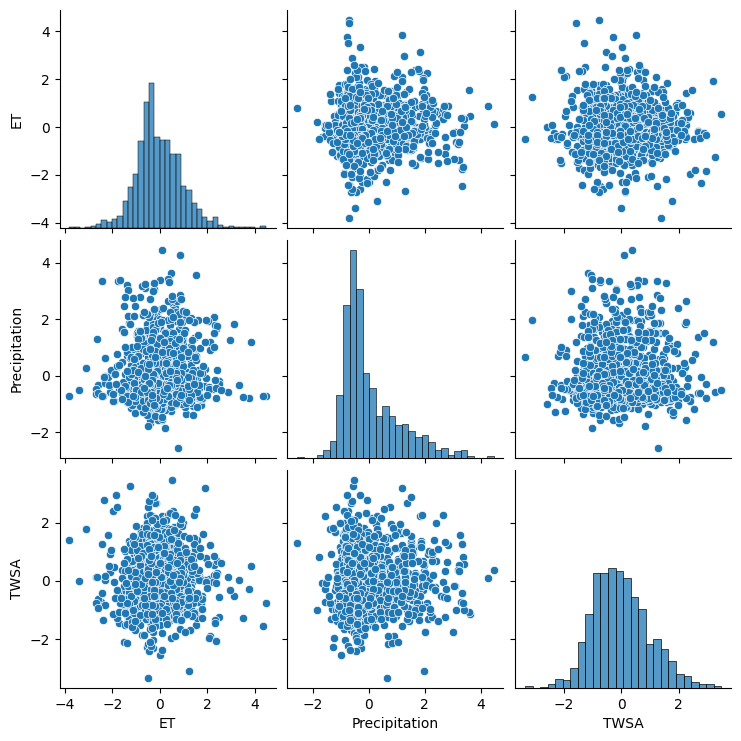

In [435]:
# Plot the simulated data
g = sns.pairplot(pd.DataFrame({
    'ET': gaussian_simulated_et,
    'Precipitation': gaussian_simulated_precip,
    'TWSA': gaussian_simulated_twsa
}))

plt.show()

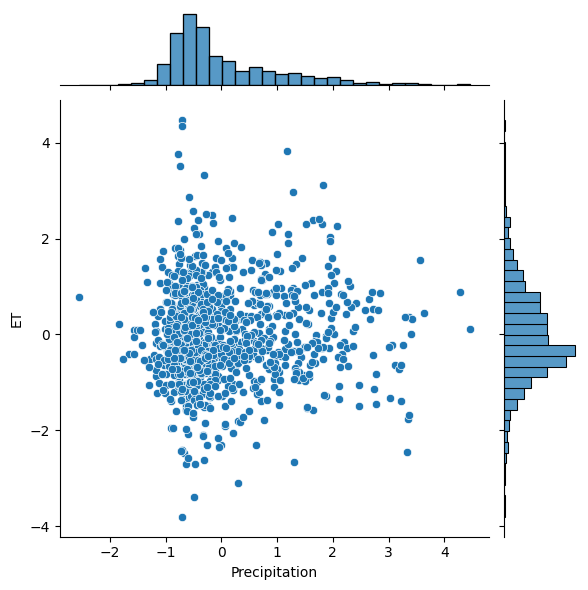

In [483]:
sns.jointplot(data=pd.DataFrame({
    'ET': gaussian_simulated_et,
    'Precipitation': gaussian_simulated_precip,
    'TWSA': gaussian_simulated_twsa
}), x='Precipitation', y='ET')

In [223]:
# Compute the joint CDF using the fitted copula model
joint_cdf = best_copula.cdf(uniform_data)

# Display some of the joint probabilities
print("Joint CDF Values:", joint_cdf[:10])


Joint CDF Values: [0.01533613 0.09178833 0.06566057 0.085382   0.00400523 0.0707668
 0.01182558 0.00743852 0.03216103 0.02109232]


In [226]:
max(joint_cdf)

0.9832893223043295

In [ ]:
with rasterio.open(landform) as src:
    landform = src.read(1)  # Read the first band (class values 1-5)
    transform = src.transform
    crs = src.crs




In [232]:
landform

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

In [235]:
src = rasterio.open(landform)
# src.read(1)

In [239]:
h = src.read(1)

In [240]:
h.shape

(4188, 3550)

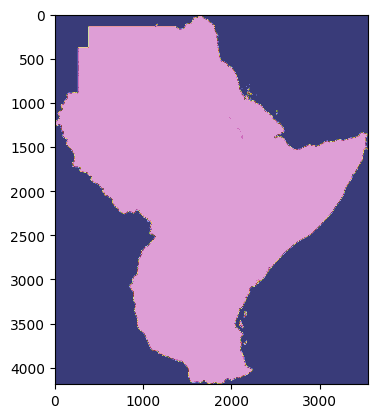

In [245]:
plt.imshow(h, cmap='tab20b_r')

In [ ]:
# Align all data into a Dataset
data = xr.Dataset({'ET': et, 'Precip': precip, 'TWS': tws, 'Landform': landform_xr})

# Function to compute Kendall’s Tau for a sub-region
def compute_kendall_tau(data_subset, var1, var2):
    if not data_subset[var1].values.flatten().size or not data_subset[var2].values.flatten().size:
        return np.nan, np.nan
    tau, p_value = kendalltau(data_subset[var1].values.flatten(), data_subset[var2].values.flatten())
    return tau, p_value

# Function to compute tail dependence (10% tails)
def check_tail_dependence(x, y, tail_percent=0.1):
    n = len(x)
    if n == 0:
        return np.nan, np.nan
    threshold = int(n * tail_percent)
    
    if threshold == 0 or np.all(np.isnan(x)) or np.all(np.isnan(y)):
        return np.nan, np.nan
    
    sorted_indices = np.argsort(x[~np.isnan(x)])
    x_sorted = x[~np.isnan(x)][sorted_indices]
    y_sorted = y[~np.isnan(y)][sorted_indices[:len(x_sorted)]]
    
    if len(x_sorted) < threshold or len(y_sorted) < threshold:
        return np.nan, np.nan
    
    # Lower tail: P(Y < low | X < low)
    lower_x = x_sorted[:threshold]
    lower_y = y_sorted[:threshold]
    lower_count = np.sum(lower_y < np.percentile(y[~np.isnan(y)], 10))
    lambda_lower = lower_count / threshold if threshold > 0 else np.nan
    
    # Upper tail: P(Y > high | X > high)
    upper_x = x_sorted[-threshold:]
    upper_y = y_sorted[-threshold:]
    upper_count = np.sum(upper_y > np.percentile(y[~np.isnan(y)], 90))
    lambda_upper = upper_count / threshold if threshold > 0 else np.nan
    
    return lambda_lower, lambda_upper



In [ ]:
# Analyze each landform class (1 to 5)
landform_classes = np.unique(landform_xr.values[~np.isnan(landform_xr.values)])
for class_id in landform_classes:
    print(f"\nLandform Class {int(class_id)}:")
    subregion = data.where(data['Landform'] == class_id).dropna(dim='lat').dropna(dim='lon')
    
    if not subregion.empty:
        # Kendall’s Tau Correlations
        pairs = [('ET', 'Precip'), ('ET', 'TWS'), ('TWS', 'Precip')]
        print("Kendall's Tau Correlations:")
        for var1, var2 in pairs:
            tau, p_value = compute_kendall_tau(subregion, var1, var2)
            if not np.isnan(tau):
                print(f"{var1} vs {var2}: Tau = {tau:.3f}, p-value = {p_value:.3f}")

        # Tail Dependence Estimates (10% tails)
        print("\nTail Dependence Estimates (10% tails):")
        for var1, var2 in pairs:
            lambda_l, lambda_u = check_tail_dependence(subregion[var1].values.flatten(), 
                                                    subregion[var2].values.flatten())
            if not np.isnan(lambda_l):
                print(f"{var1} vs {var2}: Lower Tail = {lambda_l:.3f}, Upper Tail = {lambda_u:.3f}")

        # Optional: Plot scatterplot for ET vs. Precip in this sub-region
        plt.figure(figsize=(6, 6))
        plt.scatter(subregion['ET'].values.flatten(), subregion['Precip'].values.flatten(), 
                    alpha=0.5, label='All Data', color='gray')
        plt.xlabel('ET')
        plt.ylabel('Precip')
        plt.title(f'ET vs Precip - Landform Class {int(class_id)}')
        plt.legend()
        plt.show()

# Visualize landform classes
plt.figure(figsize=(10, 5))
plt.imshow(landform_xr, cmap='viridis')
plt.colorbar(label='Landform Class')
plt.title('Landform Classes at 1-degree Resolution')
plt.show()

In [6]:
from copulas.datasets import sample_trivariate_xyz

data = sample_trivariate_xyz()

data.head()

,x,y,z
0,9.004177e-05,2.883992e-06,0.638689
1,8.819273e-01,2.911979e-07,1.058121
2,5.003865e-01,4.886504e-04,0.372506
3,1.838544e-12,5.392802e-02,0.687370
4,1.627915e-01,1.634269e-08,-0.881068


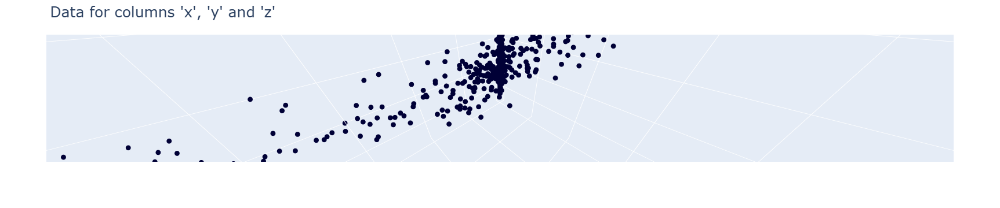

In [393]:
from copulas.visualization import scatter_3d

scatter_3d(data)